In [ ]:
# Enact Visium Data Annotation

In [18]:
from pathlib import Path
import re, warnings, os
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import torch
import seaborn as sns
import tqdm as notebook_tqdm
import matplotlib.pyplot as plt
import squidpy as sq

In [19]:
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
        print("Device name:", torch.cuda.get_device_name(0))

CUDA available: True
Device name: NVIDIA L40S


In [24]:
#spatital data
sp_P2 = sc.read_h5ad(
    "/gpfs/commons/groups/innovation/jjoseph/enact_results/P2_CRC/Cache/colon_P2/tmap/weighted_by_area|celltypist_cells_adata.h5"
)
sp_P5 = sc.read_h5ad(
    "/gpfs/commons/groups/innovation/jjoseph/enact_results/P5_CRC/Cache/colon_P5_demo/tmap/weighted_by_area|celltypist_cells_adata.h5"
)


print(sp_P2.shape)
print(sp_P5.shape)
sp_P5.obs

adata_p2 = sp_P2
adata_p5 = sp_P5

sp_P2.X

(319662, 1089)
(294395, 1089)


<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 3708450 stored elements and shape (319662, 1089)>

In [ ]:
print(adata_p2.var_names[:50])
ribo_genes = pd.read_table("rib.txt", skiprows=2, header=None)   

adata = adata_p2
adata.var["mt"] = adata.var_names.str.upper().str.startswith("MT-")
adata.var["ribo"] = (
    adata.var_names.isin(ribo_genes[0].values) |
    adata.var_names.str.upper().str.match(r"^RP[LS]")
)
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo"], percent_top=None, log1p=False, inplace=True
)
sc.pl.violin(
        adata,
        ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo"],
        multi_panel=True, jitter=0.4, show=False)

#seems like no ribo or mt genes must have beenb be fitlered out from enact 

In [ ]:
# make var 
adata_p2.var_names_make_unique()
adata_p5.var_names_make_unique()

#annotations for mito genes and QC metrics 

adata_p2.var["mt"] = adata_p2.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata_p2, qc_vars=["mt"], inplace=True)

adata_p5.var["mt"] = adata_p5.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata_p5, qc_vars=["mt"], inplace=True)


In [ ]:
ribo_genes = pd.read_table("rib.txt", skiprows=2, header=None)   

from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns

def save_figure(obj, name: str, plot_dir):
    """
    Accepts a Scanpy or Seaborn or matplotlib return object *or* None and writes .png
    """
    from pathlib import Path
    import matplotlib.pyplot as plt
    import seaborn as sns

    if plot_dir is None:
        return
    plot_dir = Path(plot_dir)
    plot_dir.mkdir(parents=True, exist_ok=True)

    # If Scanpy returned nothing, fall back to the current figure
    if obj is None:
        fig = plt.gcf()
    elif isinstance(obj, sns.axisgrid.FacetGrid):
        fig = obj.fig
    elif isinstance(obj, list):            # list of Axes
        fig = obj[0].figure
    elif hasattr(obj, "savefig"):          # Figure
        fig = obj
    else:                                  # single Axes
        fig = obj.figure

    fig.savefig(plot_dir / f"{name}.png", dpi=300, bbox_inches="tight")
    plt.close(fig)


def process_spatial_slide(
        adata: sc.AnnData,
        patient_tag: str,
        *,
        mito_pct_max: float = 15,
        ribo_pct_max: float = 2,
        gene_quantile: float = 0.99,
        n_hvg: int = 2_000,
        plot_dir: str | Path | None = "plots",
        save_h5: str | None = None,
    ) -> sc.AnnData:

    adata.var_names_make_unique()
    adata.obs["patient"] = patient_tag

    # QC filtering
    sc.pp.filter_genes(adata, min_cells=10)
    adata.var["mt"]   = adata.var_names.str.startswith("MT-")
    adata.var["ribo"] = adata.var_names.isin(ribo_genes[0].values)
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo"],
                               percent_top=None, log1p=False, inplace=True)

    upper_lim = np.quantile(adata.obs.n_genes_by_counts, gene_quantile)
    adata = adata[
        (adata.obs.n_genes_by_counts < upper_lim) &
        (adata.obs.pct_counts_mt   < mito_pct_max) &
        (adata.obs.pct_counts_ribo < ribo_pct_max)
    ].copy()


    if "counts" not in adata.layers:
        adata.layers["counts"] = adata.X.copy()

    #normalization
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    adata.raw = adata

    
    sc.pp.highly_variable_genes(
        adata,
        flavor="seurat_v3",
        n_top_genes=n_hvg,
        layer="counts",     
        subset=True
    )

    sc.pp.regress_out(adata, ["total_counts", "pct_counts_mt", "pct_counts_ribo"])
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, svd_solver="arpack")

    if plot_dir:
        save_figure(
            sc.pl.violin(
                adata,
                ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo"],
                multi_panel=True, jitter=0.4, show=False
            ),
            f"{patient_tag}_QC_violin", plot_dir
        )
        save_figure(
            sc.pl.highly_variable_genes(adata, show=False),
            f"{patient_tag}_HVGs", plot_dir
        )
        save_figure(
            sc.pl.pca_variance_ratio(adata, log=True, show=False),
            f"{patient_tag}_PCA_var_ratio", plot_dir
        )

    if save_h5:
        adata.write_h5ad(save_h5, compression="gzip")
    return adata



In [ ]:
# Load Visium slides
adata_p2 = sc.read_h5ad(
    "/gpfs/commons/groups/innovation/jjoseph/enact_results/P2_CRC/Cache/colon_P2/tmap/weighted_by_area|celltypist_cells_adata.h5"
)
adata_p5 = sc.read_h5ad(
    "/gpfs/commons/groups/innovation/jjoseph/enact_results/P5_CRC/Cache/colon_P5_demo/tmap/weighted_by_area|celltypist_cells_adata.h5"
)

p2 = process_spatial_slide(adata_p2, "P2CRC",
                           plot_dir="plots", save_h5="P2_spatial_clean.h5ad")
p5 = process_spatial_slide(adata_p5, "P5CRC",
                           plot_dir="plots", save_h5="P5_spatial_clean.h5ad")


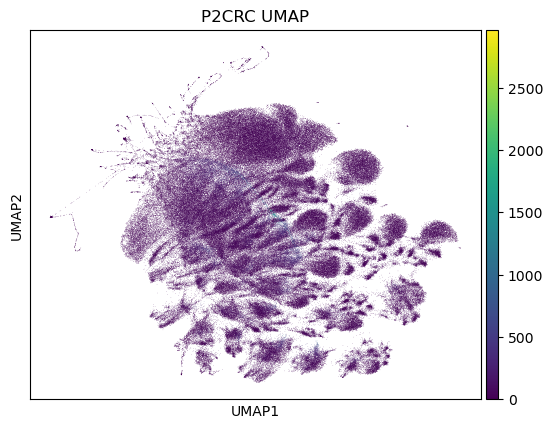

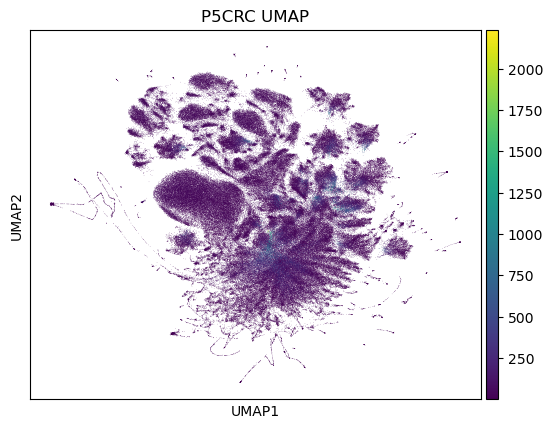

In [3]:

# Load your cleaned data
p2 = sc.read_h5ad("P2_spatial_clean.h5ad")
p5 = sc.read_h5ad("P5_spatial_clean.h5ad")

for tag, ad in [("P2CRC", p2), ("P5CRC", p5)]:
    sc.pp.neighbors(ad, n_pcs=30)
    sc.tl.umap(ad)
    sc.pl.umap(ad, color="total_counts", title=f"{tag} UMAP")


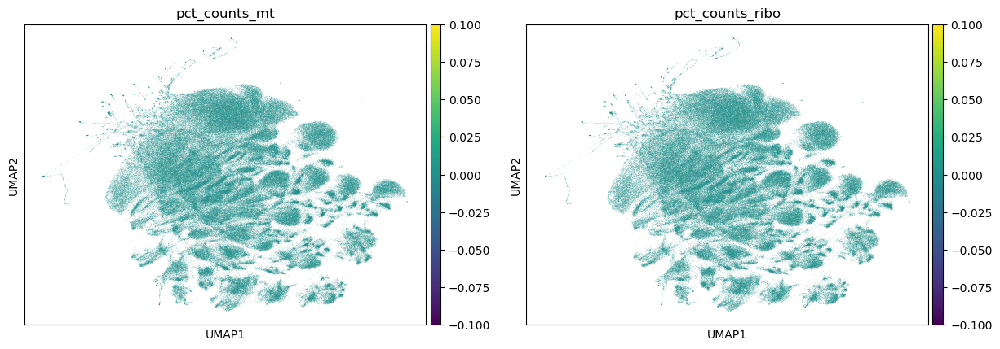

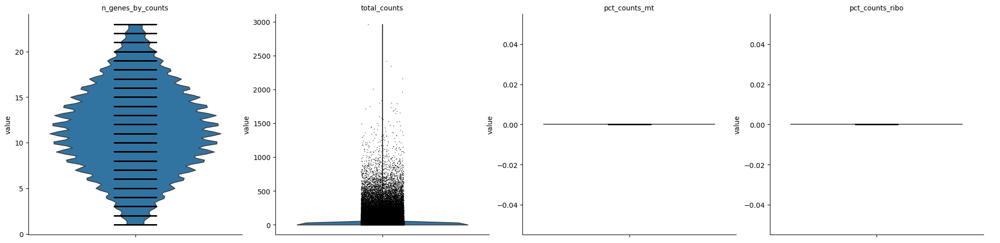

In [4]:
sc.pl.umap(p2, color=["pct_counts_mt", "pct_counts_ribo"])
sc.pl.violin(p2, ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo"], multi_panel=True)


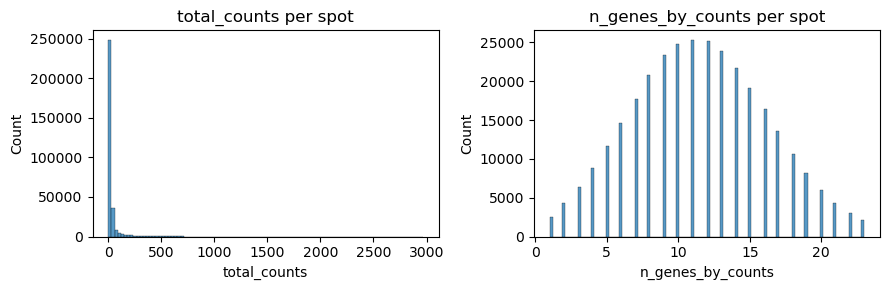

In [8]:
import seaborn as sns, matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(9, 3))
sns.histplot(p2.obs["total_counts"], bins=100, ax=axs[0])
axs[0].set_title("total_counts per spot")
sns.histplot(p2.obs["n_genes_by_counts"], bins=100, ax=axs[1])
axs[1].set_title("n_genes_by_counts per spot")
plt.tight_layout()


In [10]:
# --- dynamic thresholds ---
adata = p2
min_cnt, max_cnt = np.percentile(adata.obs["total_counts"], [1, 99])
min_genes = 3

# --- apply ---
adata = adata[
    (adata.obs.total_counts.between(min_cnt, max_cnt)) &
    (adata.obs.n_genes_by_counts >= min_genes)
].copy()
print("Remaining spots:", adata.n_obs)

import squidpy as sq

sq.gr.spatial_neighbors(adata, coord_type="grid")   # uses adata.obs[['array_row','array_col']]
sq.gr.spatial_autocorr(adata, mode="moran", genes="total_counts")  # builds graph if missing

# count neighbours within one array step
adj = adata.obsp["spatial_connectivities"]
n_neigh = np.array(adj.sum(axis=1)).flatten()
adata.obs["n_spatial_neighbors"] = n_neigh

# drop spots with <2 neighbours
adata = adata[adata.obs.n_spatial_neighbors >= 2].copy()
print("After neighbour filter:", adata.n_obs)



Remaining spots: 304031


KeyError: "Values ['total_counts'], from ['total_counts'], are not valid obs/ var names or indices."

 Cleaning P2CRC
Spots before cleanup: 314774
After lib/gene filter: 304031
After spatial filter: 287908


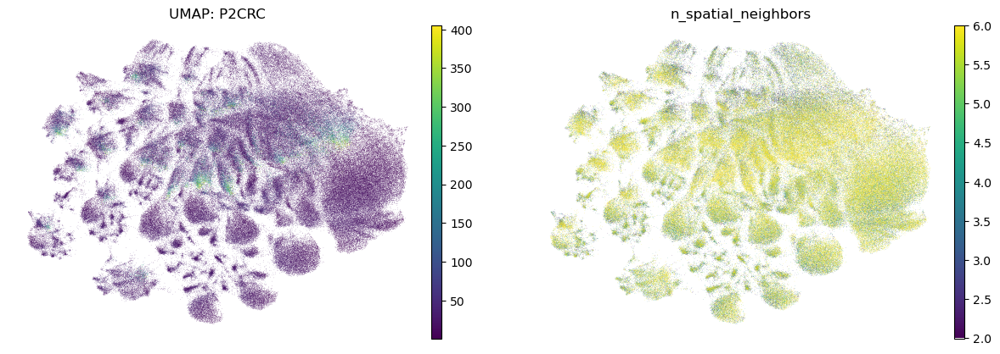

 Cleaning P5CRC
Spots before cleanup: 288207
After lib/gene filter: 272195
After spatial filter: 253570


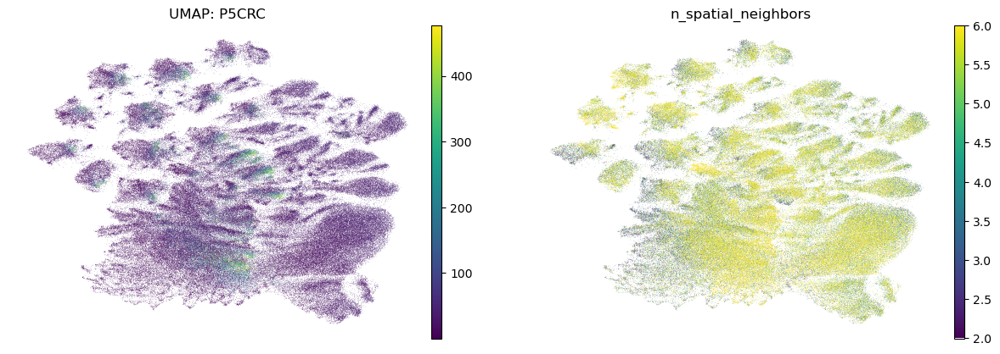

In [20]:
import numpy as np
import scanpy as sc
import squidpy as sq

#using preprocessed file 

# keep spots with UMI betweeen 1 and 99 percentiel remove outlier with hgih or low spots
# want spots with 3 genes detected

# use squidpy spatital to have neighbor graph
#calcualate immediate neighbor and then only spots with >= 2 neighbors


p2 = sc.read_h5ad("P2_spatial_clean.h5ad")
p5 = sc.read_h5ad("P5_spatial_clean.h5ad")


def clean_adata(adata, label=""):
    print(f" Cleaning {label}")
    print("Spots before cleanup:", adata.n_obs)
    
    # gene filter
    
    q1, q99 = np.percentile(adata.obs["total_counts"], [1, 99])
    min_genes = 3
    libmask = (
        adata.obs["total_counts"].between(q1, q99)
        & (adata.obs["n_genes_by_counts"] >= min_genes)
    )
    adata = adata[libmask].copy()
    print("After lib/gene filter:", adata.n_obs)
    
    #spatial filter
    if "spatial" not in adata.obsp:
        sq.gr.spatial_neighbors(adata, coord_type="grid")
    
    adj = adata.obsp["spatial_connectivities"]
    adata.obs["n_spatial_neighbors"] = np.array(adj.sum(axis=1)).flatten()
    
    spmask = adata.obs["n_spatial_neighbors"] >= 2
    adata = adata[spmask].copy()
    print("After spatial filter:", adata.n_obs)
    
    #plot umap 
    sc.pp.neighbors(adata, n_pcs=30)
    sc.tl.umap(adata)
    sc.pl.umap(
        adata,
        color=["total_counts", "n_spatial_neighbors"],
        ncols=2,
        frameon=False,
        title=f"UMAP: {label}"
    )
    
    return adata

# save the cleaned data
p2_clean = clean_adata(p2, label="P2CRC")
p5_clean = clean_adata(p5, label="P5CRC")


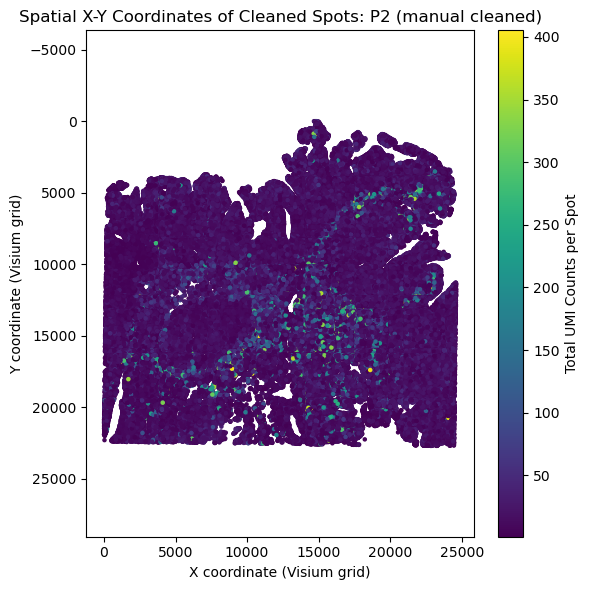

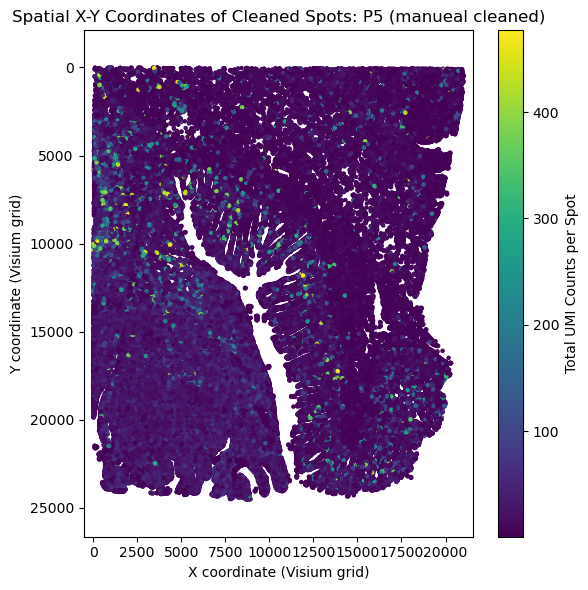

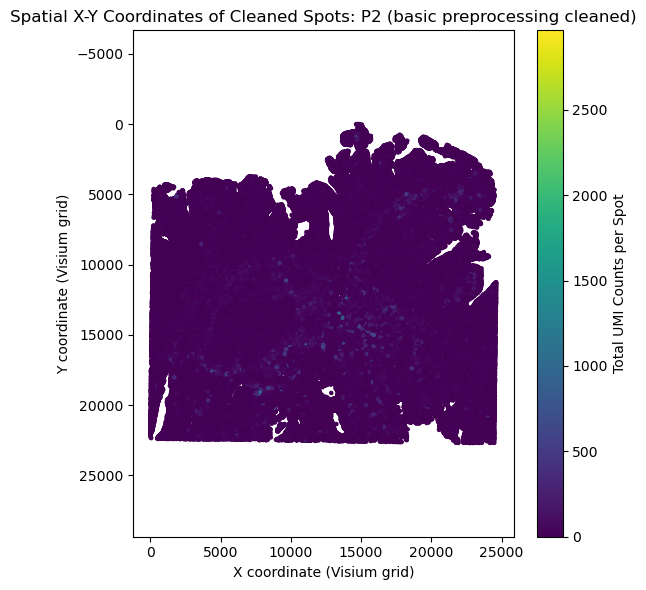

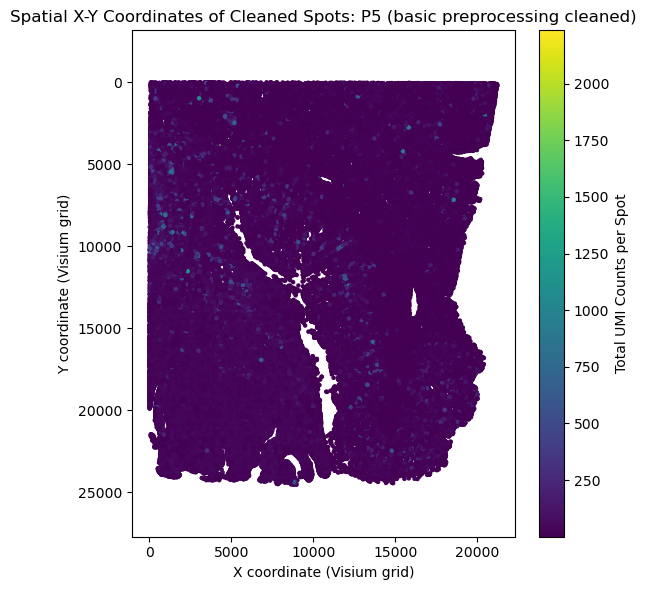

NameError: name 'p5_spatial_set_1' is not defined

In [23]:

def plot_spatial_coords(adata, patient_tag):
    """
    Plots X-Y spatial coordinates for a cleaned Visium slide,.
    """
    coords = adata.obsm["spatial"]

    if isinstance(coords, np.ndarray):
        x, y = coords[:, 0], coords[:, 1]
    elif isinstance(coords, pd.DataFrame):
        x, y = coords["cell_x"], coords["cell_y"]
    else:
        raise ValueError(f"Unexpected data type for adata.obsm['spatial']: {type(coords)}")

    plt.figure(figsize=(6, 6))
    sc = plt.scatter(
        x,
        y,
        s=5,
        c=adata.obs["total_counts"],
        cmap="viridis",
    )
    plt.xlabel("X coordinate (Visium grid)")
    plt.ylabel("Y coordinate (Visium grid)")
    plt.title(f"Spatial X-Y Coordinates of Cleaned Spots: {patient_tag}")
    plt.gca().invert_yaxis()
    plt.axis("equal")
    cbar = plt.colorbar(sc)
    cbar.set_label("Total UMI Counts per Spot") 
    plt.tight_layout()
    plt.show()

#  Plots for manual filtering
plot_spatial_coords(p2_clean, "P2 (manual cleaned)")
plot_spatial_coords(p5_clean, "P5 (manueal cleaned)")

#  old cleaned data
p2_old_clean = sc.read_h5ad("P2_spatial_clean.h5ad")
p5_old_clean = sc.read_h5ad("P5_spatial_clean.h5ad")

# pltos for old data
plot_spatial_coords(p2_old_clean, "P2 (basic preprocessing cleaned)")
plot_spatial_coords(p5_old_clean, "P5 (basic preprocessing cleaned)")

p2_spatial_set_1 = clean_adata(p5_spatial_set_1, label="P5CRC")

In [26]:
coords = adata.obsm["spatial"]
print(coords)
adata.obsm

          cell_x  cell_y
id                      
ID_18217   24063    3411
ID_18265   24061    3451
ID_18449   24000    3705
ID_18472   24060    3914
ID_18615   24083    3444
...          ...     ...
ID_99993    9560    8488
ID_99994    8968    8957
ID_99995   10214    8990
ID_99996    9428    8182
ID_99999    9993    8335

[269109 rows x 2 columns]


AxisArrays with keys: X_pca, spatial, stats, X_umap

In [37]:
p2 

,cell_type,patch_id,patient,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,n_spatial_neighbors
id,,,,,,,,,,
ID_281609,cms2,patch_3_6.csv,P5CRC,9,26.804941,0.0,0.0,0.0,0.0,4.0
ID_282284,iga+ plasma,patch_3_6.csv,P5CRC,3,3.512285,0.0,0.0,0.0,0.0,6.0
ID_282307,cms2,patch_3_6.csv,P5CRC,7,8.107602,0.0,0.0,0.0,0.0,5.0
ID_282548,cms2,patch_3_6.csv,P5CRC,5,2.882187,0.0,0.0,0.0,0.0,2.0
ID_282606,cms2,patch_3_6.csv,P5CRC,3,0.688045,0.0,0.0,0.0,0.0,3.0
...,...,...,...,...,...,...,...,...,...,...
ID_159260,iga+ plasma,patch_2_2.csv,P5CRC,9,9.958228,0.0,0.0,0.0,0.0,2.0
ID_159262,cms3,patch_2_2.csv,P5CRC,14,21.127001,0.0,0.0,0.0,0.0,6.0
ID_159263,stromal 1,patch_2_2.csv,P5CRC,6,6.941236,0.0,0.0,0.0,0.0,5.0


In [39]:
# For your cleaned P2 AnnData object
p2_clean.write_h5ad("p2_enact_manual_clean.h5ad", compression="gzip")
# For your cleaned P2 AnnData object
p5_clean.write_h5ad("p5_enact_manual_clean.h5ad", compression="gzip")


In [ ]:
# def save(fig, name, outdir="plots"):
#     outdir = Path(outdir); outdir.mkdir(exist_ok=True)
#     fig.savefig(outdir / f"{name}.png", dpi=300, bbox_inches="tight")
#     plt.close(fig)


# p2 = sc.read_h5ad("p2_enact_manual_clean.h5ad")
# p5 = sc.read_h5ad("p5_enact_manual_clean.h5ad")

# # harmonise genes
# shared = p2.var_names.intersection(p5.var_names)          # 1 089 genes
# p2    = p2[:, shared].copy()
# p5    = p5[:, shared].copy()

# adata = p2.concatenate(
#     p5,
#     batch_key="slide",
#     batch_categories=["P2CRC", "P5CRC"],
#     index_unique=None,        # keep original barcodes
#     uns_merge="unique"
# )

# print("Concatenated shape:", adata.shape)   # ~614k × 1 089


# #harmony integration
# sc.pp.pca(adata, n_comps=50, svd_solver="arpack")
# ho = hm.run_harmony(
#     adata.obsm["X_pca"],
#     adata.obs,
#     vars_use=["slide"]
# )
# adata.obsm["X_pca_harmony"] = ho.Z_corr.T      # cells × PCs
# sc.pp.neighbors(adata, use_rep="X_pca_harmony")
# sc.tl.umap(adata)

# fig = sc.pl.umap(
#     adata,
#     color="slide",
#     title="Harmony-integrated UMAP",
#     return_fig=True,
#     frameon=False
# )
# save(fig, "UMAP_harmony_slide")

# #scvi integratoionb
# #  -- make sure raw counts are in .layers["counts"]; scVI needs them
# if "counts" not in adata.layers:
#     adata.layers["counts"] = adata.X.copy()

# scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="slide")
# model = scvi.model.SCVI(adata, n_layers=2, n_latent=30)
# model.train(max_epochs=30)                     # fast on CPU; GPU even faster

# adata.obsm["X_scvi"] = model.get_latent_representation()
# sc.pp.neighbors(adata, use_rep="X_scvi")
# sc.tl.umap(adata)

# fig = sc.pl.umap(
#     adata,
#     color="slide",
#     title="scVI-integrated UMAP",
#     return_fig=True,
#     frameon=False
# )
# save(fig, "UMAP_scvi_slide")


# for slide in adata.obs["slide"].cat.categories:
#     sub = adata[adata.obs["slide"] == slide].copy()
#     sc.pp.neighbors(sub, use_rep="X_scvi")
#     sc.tl.umap(sub)
#     fig = sc.pl.umap(
#         sub,
#         color="total_counts",
#         title=f"{slide} (scVI space)",
#         return_fig=True,
#         frameon=False
#     )
#     save(fig, f"UMAP_{slide}_scvi")

# print("All figures written to ./plots/")


In [40]:
from pathlib import Path
import scanpy as sc
import harmonypy as hm
import scvi

# Load cleaned slides
p2 = sc.read_h5ad("p2_enact_manual_clean.h5ad")
p5 = sc.read_h5ad("p5_enact_manual_clean.h5ad")

# Harmonise genes and concatenate

shared = p2.var_names.intersection(p5.var_names)          # shared genes
p2 = p2[:, shared].copy()
p5 = p5[:, shared].copy()

adata = p2.concatenate(
    p5,
    batch_key="slide",
    batch_categories=["single_cell", "spatial"],
    index_unique=None,       
    uns_merge="unique"
)

print("Concatenated shape:", adata.shape)   # 614k × 1,089 genes

# Harmony integration

sc.pp.pca(adata, n_comps=50, svd_solver="arpack")
ho = hm.run_harmony(
    adata.obsm["X_pca"],
    adata.obs,
    vars_use=["slide"]
)
adata.obsm["X_pca_harmony"] = ho.Z_corr.T      # cells × PCs
sc.pp.neighbors(adata, use_rep="X_pca_harmony")
sc.tl.umap(adata)

fig = sc.pl.umap(
    adata,
    color="slide",
    title="Harmony-integrated UMAP",
    return_fig=True,
    frameon=False
)
fig.show()

# 
# scVI integration

if "counts" not in adata.layers:
    adata.layers["counts"] = adata.X.copy()

scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="slide")
model = scvi.model.SCVI(adata, n_layers=2, n_latent=30)
model.train(max_epochs=30)                    

adata.obsm["X_scvi"] = model.get_latent_representation()
sc.pp.neighbors(adata, use_rep="X_scvi")
sc.tl.umap(adata)

fig = sc.pl.umap(
    adata,
    color="slide",
    title="scVI-integrated UMAP",
    return_fig=True,
    frameon=False
)
fig.show()

# per-slide UMAPs in the scVI space
for slide in adata.obs["slide"].cat.categories:
    sub = adata[adata.obs["slide"] == slide].copy()
    sc.pp.neighbors(sub, use_rep="X_scvi")
    sc.tl.umap(sub)
    fig = sc.pl.umap(
        sub,
        color="total_counts",
        title=f"{slide} (scVI space)",
        return_fig=True,
        frameon=False
    )
    fig.show()


/scratch/ipykernel_207173/2735429092.py:16: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = p2.concatenate(
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. 

Concatenated shape: (541478, 313)


2025-07-01 12:47:16,798 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-07-01 12:48:45,453 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-07-01 12:48:46,312 - harmonypy - INFO - Iteration 1 of 10
2025-07-01 12:50:56,756 - harmonypy - INFO - Iteration 2 of 10
2025-07-01 12:53:01,705 - harmonypy - INFO - Iteration 3 of 10
2025-07-01 12:54:53,767 - harmonypy - INFO - Iteration 4 of 10
2025-07-01 12:56:00,834 - harmonypy - INFO - Iteration 5 of 10
2025-07-01 12:56:40,572 - harmonypy - INFO - Iteration 6 of 10
2025-07-01 12:57:19,013 - harmonypy - INFO - Iteration 7 of 10
2025-07-01 12:57:58,638 - harmonypy - INFO - Iteration 8 of 10
2025-07-01 12:58:37,103 - harmonypy - INFO - Converged after 8 iterations


KeyboardInterrupt: 

/scratch/ipykernel_1445822/1516504500.py:32: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = sc_ref.concatenate(


P2CRC concatenated: (315763, 278)


2025-07-01 14:23:37,710 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-07-01 14:24:22,013 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-07-01 14:24:22,522 - harmonypy - INFO - Iteration 1 of 10
2025-07-01 14:25:35,627 - harmonypy - INFO - Iteration 2 of 10
2025-07-01 14:26:48,637 - harmonypy - INFO - Iteration 3 of 10
2025-07-01 14:28:01,313 - harmonypy - INFO - Iteration 4 of 10
2025-07-01 14:28:56,825 - harmonypy - INFO - Iteration 5 of 10
2025-07-01 14:29:59,295 - harmonypy - INFO - Iteration 6 of 10
2025-07-01 14:30:54,869 - harmonypy - INFO - Converged after 6 iterations


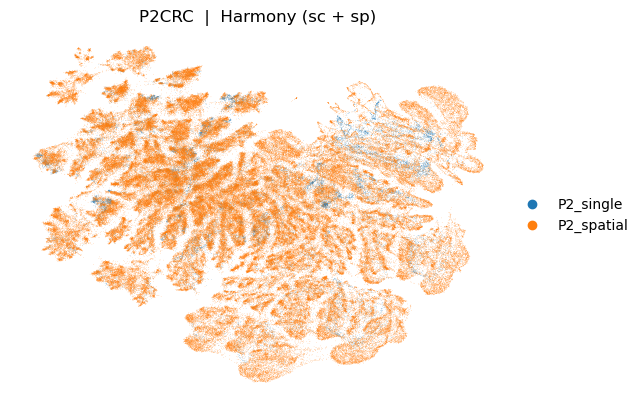

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


P2CRC: Harmony-integrated AnnData saved to P2CRC_integrated_harmony.h5ad


/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /nfs/home/jjoseph/.local/lib/python3.10/site-package ...
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /nfs/home/jjoseph/.local/lib/python3.10/site-package ...
You are using a CUDA device ('NVIDIA L40S') that has Tensor Cores. To properly utilize them, you should set `torch

Epoch 1/40:   0%|                       | 0/40 [00:00<?, ?it/s]

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 2/40:   2%| | 1/40 [00:16<10:25, 16.03s/it, v_num=1, trai

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 3/40:   5%| | 2/40 [00:29<09:09, 14.46s/it, v_num=1, trai

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 4/40:   8%| | 3/40 [00:42<08:34, 13.90s/it, v_num=1, trai

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 5/40:  10%| | 4/40 [00:55<08:09, 13.59s/it, v_num=1, trai

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 6/40:  12%|▏| 5/40 [01:08<07:47, 13.37s/it, v_num=1, trai

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 7/40:  15%|▏| 6/40 [01:21<07:30, 13.24s/it, v_num=1, trai

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 8/40:  18%|▏| 7/40 [01:34<07:14, 13.18s/it, v_num=1, trai

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 9/40:  20%|▏| 8/40 [01:47<06:59, 13.12s/it, v_num=1, trai

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 10/40:  22%|▏| 9/40 [02:00<06:46, 13.10s/it, v_num=1, tra

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 11/40:  25%|▎| 10/40 [02:13<06:31, 13.06s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 12/40:  28%|▎| 11/40 [02:26<06:18, 13.04s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 13/40:  30%|▎| 12/40 [02:39<06:04, 13.03s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 14/40:  32%|▎| 13/40 [02:53<05:55, 13.16s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 15/40:  35%|▎| 14/40 [03:06<05:40, 13.11s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 16/40:  38%|▍| 15/40 [03:19<05:26, 13.07s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 17/40:  40%|▍| 16/40 [03:32<05:13, 13.05s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 18/40:  42%|▍| 17/40 [03:45<04:59, 13.03s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 19/40:  45%|▍| 18/40 [03:58<04:46, 13.01s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 20/40:  48%|▍| 19/40 [04:11<04:32, 13.00s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 21/40:  50%|▌| 20/40 [04:24<04:19, 13.00s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 22/40:  52%|▌| 21/40 [04:37<04:06, 12.99s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 23/40:  55%|▌| 22/40 [04:50<03:55, 13.06s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 24/40:  57%|▌| 23/40 [05:03<03:41, 13.04s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 25/40:  60%|▌| 24/40 [05:16<03:28, 13.02s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 26/40:  62%|▋| 25/40 [05:29<03:15, 13.03s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 27/40:  65%|▋| 26/40 [05:42<03:02, 13.03s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 28/40:  68%|▋| 27/40 [05:55<02:51, 13.18s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 29/40:  70%|▋| 28/40 [06:09<02:40, 13.35s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 30/40:  72%|▋| 29/40 [06:22<02:25, 13.25s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 31/40:  75%|▊| 30/40 [06:35<02:11, 13.16s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 32/40:  78%|▊| 31/40 [06:48<01:58, 13.19s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 33/40:  80%|▊| 32/40 [07:01<01:45, 13.13s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 34/40:  82%|▊| 33/40 [07:14<01:31, 13.06s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 35/40:  85%|▊| 34/40 [07:27<01:18, 13.03s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 36/40:  88%|▉| 35/40 [07:40<01:05, 13.01s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 37/40:  90%|▉| 36/40 [07:53<00:51, 12.98s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 38/40:  92%|▉| 37/40 [08:06<00:38, 12.97s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 39/40:  95%|▉| 38/40 [08:19<00:25, 12.97s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 40/40:  98%|▉| 39/40 [08:32<00:13, 13.03s/it, v_num=1, tr

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 40/40: 100%|█| 40/40 [08:46<00:00, 13.25s/it, v_num=1, tr

`Trainer.fit` stopped: `max_epochs=40` reached.


Epoch 40/40: 100%|█| 40/40 [08:46<00:00, 13.16s/it, v_num=1, tr


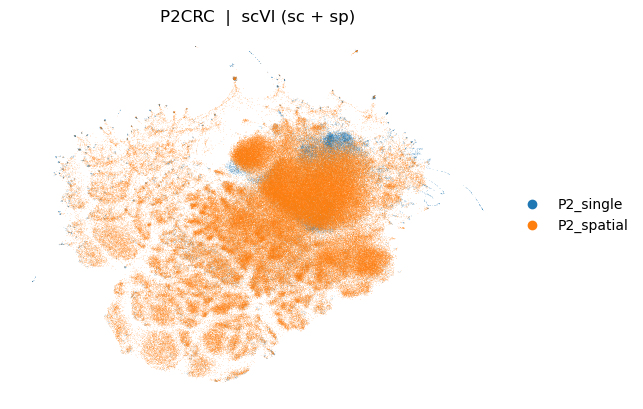

P2CRC: scVI-integrated AnnData saved to P2CRC_integrated_scvi.h5ad


InvalidParameterError: The 'n_neighbors' parameter of KNeighborsTransformer must be an int in the range [1, inf) or None. Got -1 instead.

In [5]:
import scanpy as sc, numpy as np, harmonypy as hm, scvi
import matplotlib.pyplot as plt


files = {
    "P2CRC": {
        "single": "P2CRC_clean.h5ad",
        "spatial": "p2_enact_manual_clean.h5ad",
    },
    "P5CRC": {
        "single": "P5CRC_clean.h5ad",
        "spatial": "p5_enact_manual_clean.h5ad",
    },
}

# 2) integration routine
def integrate_sc_and_sp(single_h5, spatial_h5, tag):
    # 1) load
    sc_ref = sc.read_h5ad(single_h5)
    sp_ref = sc.read_h5ad(spatial_h5)

    # 2) intersect shared genes
    shared = sc_ref.var_names.intersection(sp_ref.var_names)
    sc_ref = sc_ref[:, shared].copy()
    sp_ref = sp_ref[:, shared].copy()

    # 3) mark source
    sc_ref.obs["source"] = "single_cell"
    sp_ref.obs["source"] = "spatial"

    # 4) concatenate
    adata = sc_ref.concatenate(
        sp_ref,
        batch_key="source",
        batch_categories=["P2_single", "P2_spatial"],
        index_unique=None,
        uns_merge="unique"
    )
    print(f"{tag} concatenated:", adata.shape)

    if "counts" not in adata.layers:
        adata.layers["counts"] = adata.X.copy()

    # harmony 
    sc.pp.pca(adata, n_comps=50, svd_solver="arpack")
    ho = hm.run_harmony(adata.obsm["X_pca"], adata.obs, vars_use=["source"])
    adata.obsm["X_pca_harmony"] = ho.Z_corr.T
    sc.pp.neighbors(adata, use_rep="X_pca_harmony")
    sc.tl.umap(adata)
    fig = sc.pl.umap(
        adata, color="source",
        title=f"{tag}  |  Harmony (sc + sp)",
        return_fig=True, frameon=False
    )
    plt.show(fig)

    adata.write_h5ad(f"{tag}_integrated_harmony.h5ad", compression="gzip")
    print(f"{tag}: Harmony-integrated AnnData saved to {tag}_integrated_harmony.h5ad")

    #  scVI 
    scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="source")
    vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30)
    vae.train(max_epochs=40)        
    adata.obsm["X_scvi"] = vae.get_latent_representation()
    sc.pp.neighbors(adata, use_rep="X_scvi")
    sc.tl.umap(adata)
    fig = sc.pl.umap(
        adata, color="source",
        title=f"{tag}  |  scVI (sc + sp)",
        return_fig=True, frameon=False
    )
    plt.show(fig)

    adata.write_h5ad(f"{tag}_integrated_scvi.h5ad", compression="gzip")
    print(f"{tag}: scVI-integrated AnnData saved to {tag}_integrated_scvi.h5ad")


    # modality-specific UMAPs in scVI space
    for src in ["single_cell", "spatial"]:
        sub = adata[adata.obs["source"] == src].copy()
        sc.pp.neighbors(sub, use_rep="X_scvi")
        sc.tl.umap(sub)
        fig = sc.pl.umap(
            sub, color="total_counts",
            title=f"{tag} {src} (scVI space)",
            return_fig=True, frameon=False
        )
        plt.show(fig)

    print(f"{tag}: figures plotted interactively.\n")

# run for BOTH patients
for tag, paths in files.items():
    integrate_sc_and_sp(paths["single"], paths["spatial"], tag=tag)


👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 314774 cells and 1087 genes
🔗 Matching reference genes in the model
🧬 141 features used for prediction
⚖️ Scaling input data



 Annotating P2CRC with CellTypist 


🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, will construct one before the over-clustering
⛓️ Over-clustering input data with resolution set to 30
🗳️ Majority voting the predictions
✅ Majority voting done!


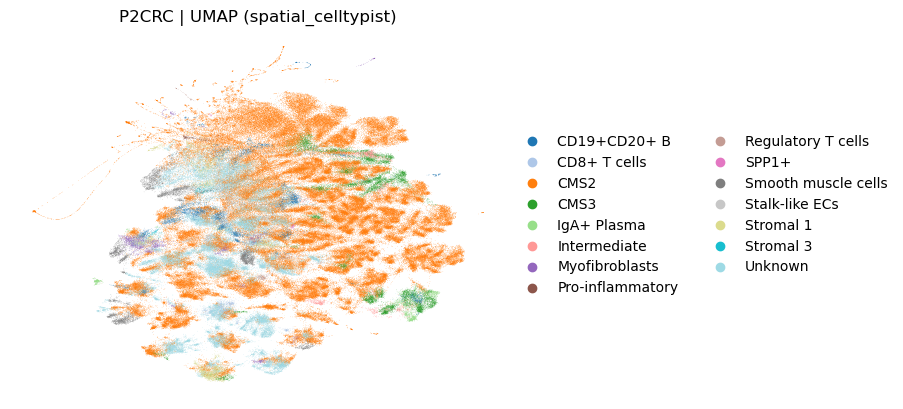

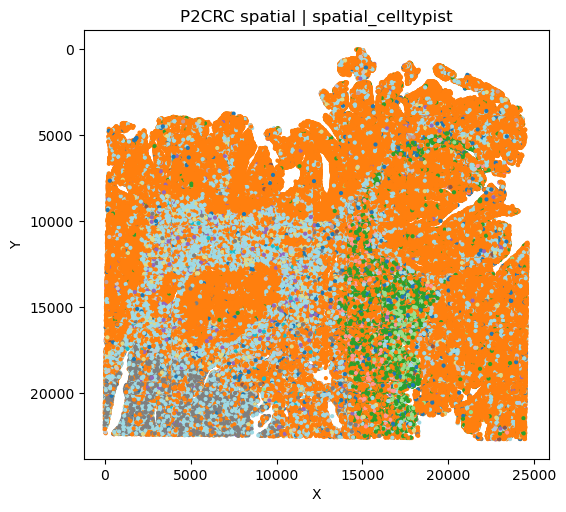

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 288207 cells and 1087 genes
🔗 Matching reference genes in the model
🧬 112 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels



 P2CRC done:
   - CellTypist labels stored in .obs['spatial_celltypist']
   - Plots saved to ./plots/
   - Annotated AnnData saved as P2CRC_spatial_spatial_celltypist.h5ad

 Annotating P5CRC with CellTypist 


✅ Prediction done!
👀 Can not detect a neighborhood graph, will construct one before the over-clustering
⛓️ Over-clustering input data with resolution set to 30
🗳️ Majority voting the predictions
✅ Majority voting done!


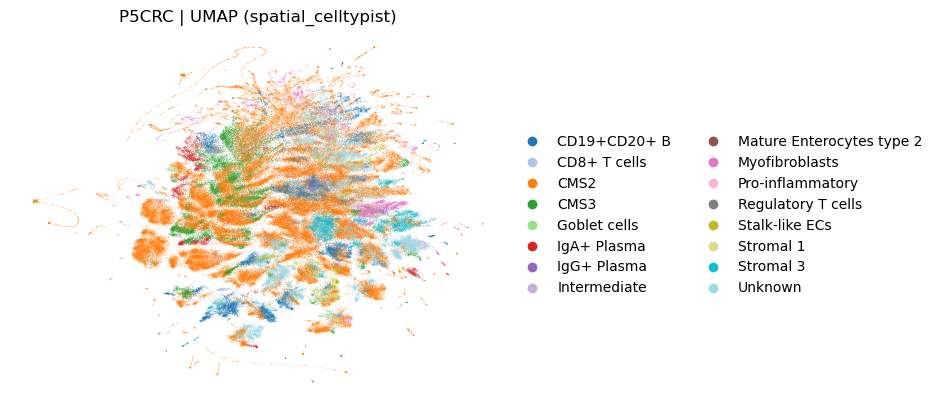

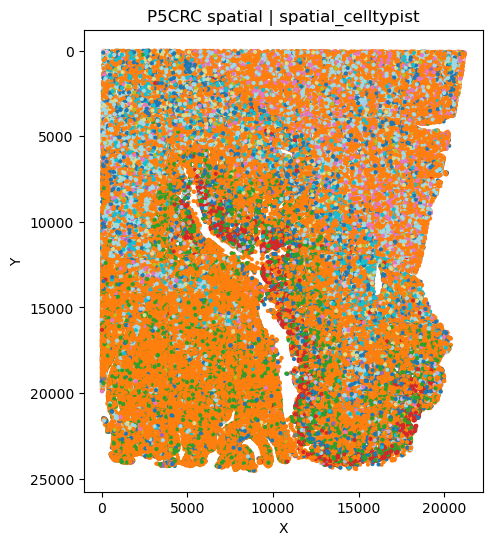


 P5CRC done:
   - CellTypist labels stored in .obs['spatial_celltypist']
   - Plots saved to ./plots/
   - Annotated AnnData saved as P5CRC_spatial_spatial_celltypist.h5ad


In [13]:
import scanpy as sc
import celltypist
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

def annotate_and_plot_spatial(
        sp: sc.AnnData,
        tag: str,
        *,
        model_path: str = "Human_Colorectal_Cancer.pkl",
        label_col: str = "spatial_celltypist"
):
    """
    Annotate a cleaned Visium AnnData with CellTypist and plot UMAP + X-Y scatter interactively.
    Saves plots and writes the annotated AnnData to disk.
    """
    print(f"\n Annotating {tag} with CellTypist ")
    res = celltypist.annotate(sp, model=model_path, majority_voting=True)
    sp.obs[label_col] = res.predicted_labels["majority_voting"]
    sp.obs["ct_conf"] = res.probability_matrix.max(axis=1)

    sc.pp.pca(sp)
    sc.pp.neighbors(sp)
    sc.tl.umap(sp)

    fig = sc.pl.umap(
        sp, color=label_col, palette="tab20",
        title=f"{tag} | UMAP ({label_col})",
        return_fig=True, frameon=False
    )
    Path("plots").mkdir(exist_ok=True)
    fig.savefig(f"plots/{tag}_UMAP_{label_col}.png", dpi=300)
    plt.show()  # display UMAP interactively
    plt.close(fig)

    #  X–Y scatter colored by predicted labels
    xy = sp.obsm["spatial"]
    if isinstance(xy, pd.DataFrame):
        xy = xy.to_numpy() 

    lab = sp.obs[label_col].astype("category")
    fig, ax = plt.subplots(figsize=(6, 6))
    scplot = ax.scatter(
        xy[:, 0], xy[:, 1],
        s=4, c=lab.cat.codes, cmap="tab20", rasterized=True
    )
    ax.set_aspect("equal")
    ax.invert_yaxis()
    ax.set_title(f"{tag} spatial | {label_col}")
    ax.set_xlabel("X"); ax.set_ylabel("Y")
    fig.savefig(f"plots/{tag}_XY_{label_col}.png", dpi=300)
    plt.show()  
    plt.close(fig)

    sp.write_h5ad(f"{tag}_spatial_{label_col}.h5ad", compression="gzip")
    print(f"\n {tag} done:\n"
          f"   CellTypist labels stored in .obs['{label_col}']\n"
          f"   Plots saved to ./plots/\n"
          f"   Annotated AnnData saved as {tag}_spatial_{label_col}.h5ad")

if __name__ == "__main__":
    p2_clean = sc.read_h5ad("P2_spatial_clean.h5ad")
    p5_clean = sc.read_h5ad("P5_spatial_clean.h5ad")

    annotate_and_plot_spatial(p2_clean, "P2CRC")
    annotate_and_plot_spatial(p5_clean, "P5CRC")


In [10]:
print("obsm keys:", p2_clean.obsm.keys())

obsm keys: KeysView(AxisArrays with keys: X_pca, spatial, stats)



Plotting P2CRC from P2CRC_spatial_spatial_celltypist.h5ad


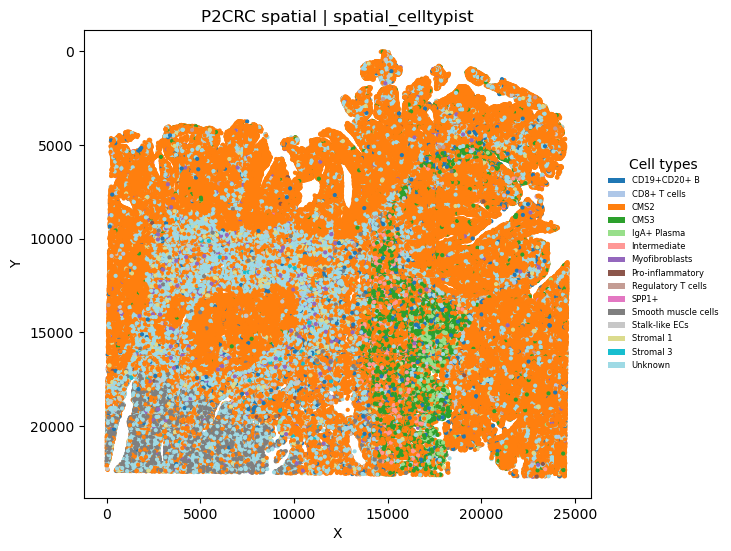

  Plot with legend saved to plots/P2CRC_XY_spatial_celltypist_with_side_legend.png

Plotting P5CRC from P5CRC_spatial_spatial_celltypist.h5ad


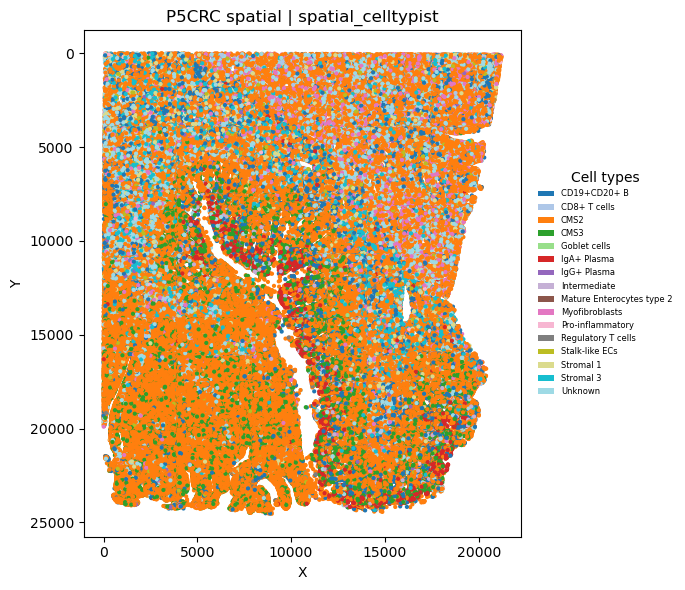

  Plot with legend saved to plots/P5CRC_XY_spatial_celltypist_with_side_legend.png


In [15]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.patches as mpatches

def plot_spatial_with_side_legend(adata_path, tag, label_col="spatial_celltypist"):
    """
    Load an annotated spatial AnnData and plot X-Y scatter with a legend on the side.
    Saves the plot to disk.
    """
    print(f"\nPlotting {tag} from {adata_path}")
    sp = sc.read_h5ad(adata_path)

    # Get spatial coordinates
    xy = sp.obsm["spatial"]
    if isinstance(xy, pd.DataFrame):
        xy = xy.to_numpy()

    # Get predicted labels
    lab = sp.obs[label_col].astype("category")
    categories = lab.cat.categories
    colors = plt.get_cmap("tab20")(np.linspace(0, 1, len(categories)))

    # Map labels to colors
    color_dict = dict(zip(categories, colors))
    cell_colors = [color_dict[l] for l in lab]

    # Make scatter plot
    fig, ax = plt.subplots(figsize=(7, 6))
    scplot = ax.scatter(
        xy[:, 0], xy[:, 1],
        s=4, c=cell_colors, rasterized=True
    )

    ax.set_aspect("equal")
    ax.invert_yaxis()
    ax.set_title(f"{tag} spatial | {label_col}")
    ax.set_xlabel("X"); ax.set_ylabel("Y")

    # Build legend patches
    legend_elements = [
        mpatches.Patch(facecolor=color_dict[cat], label=cat)
        for cat in categories
    ]
    ax.legend(
        handles=legend_elements,
        loc='center left', bbox_to_anchor=(1.02, 0.5),
        fontsize=6, frameon=False, title="Cell types"
    )

    # Save figure
    Path("plots").mkdir(exist_ok=True)
    outpath = f"plots/{tag}_XY_{label_col}_with_side_legend.png"
    fig.tight_layout()
    fig.savefig(outpath, dpi=300, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"  Plot with legend saved to {outpath}")

if __name__ == "__main__":
    p2_path = "P2CRC_spatial_spatial_celltypist.h5ad"
    p5_path = "P5CRC_spatial_spatial_celltypist.h5ad"

    plot_spatial_with_side_legend(p2_path, "P2CRC")
    plot_spatial_with_side_legend(p5_path, "P5CRC")


P2CRC: 6857 single-cell labels and 287908 spatial labels copied.


/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


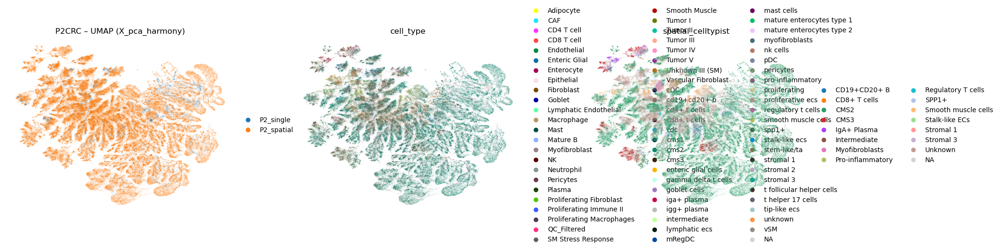

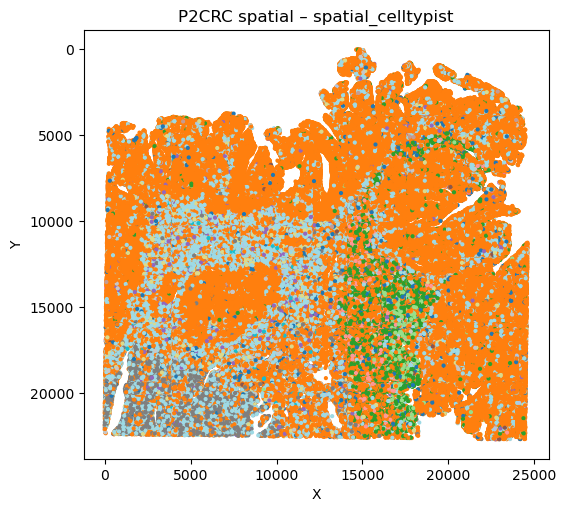

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'P5CRC_integrated_scvi.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [1]:
import glob, scanpy as sc, numpy as np, matplotlib.pyplot as plt, re

LABEL_SC = "cell_type"              # single-cell label column
LABEL_SP = "spatial_celltypist"     # CellTypist label column
EMBED    = "X_pca_harmony"          # or "X_scvi"

def drop_dups(adata):
    """Remove duplicate barcodes, keeping the first."""
    if adata.obs_names.has_duplicates:
        adata._inplace_subset_obs(~adata.obs_names.duplicated(keep="first"))
    return adata

for tag in ["P2CRC", "P5CRC"]:

    # ────── load files ───────────────────────────────────────────────
    adata_int = sc.read_h5ad(f"{tag}_integrated_scvi.h5ad")
    adata_sc  = sc.read_h5ad("P2P5_labeled.h5ad")
    adata_sp  = sc.read_h5ad(glob.glob(f"{tag}_spatial*_celltypist.h5ad")[0])

    adata_sc.obs_names = adata_sc.obs_names.str.replace(r"-\d+$", "-1", regex=True)
    adata_sc = drop_dups(adata_sc)
    adata_sp = drop_dups(adata_sp)

    if adata_int.obs_names.has_duplicates:
        mask = adata_int.obs_names.duplicated(keep="first")
        adata_int.obs_names = [
            idx if not dup else f"{idx}_dup"
            for idx, dup in zip(adata_int.obs_names, mask)
        ]

    common_sc = adata_sc.obs_names.intersection(adata_int.obs_names)
    common_sp = adata_sp.obs_names.intersection(adata_int.obs_names)

    for col in [LABEL_SC, LABEL_SP]:
        if col in adata_int.obs:
            adata_int.obs[col] = adata_int.obs[col].astype("object")

    adata_int.obs.loc[common_sc, LABEL_SC] = (
        adata_sc.obs.loc[common_sc, LABEL_SC].astype(str).values
    )
    adata_int.obs.loc[common_sp, LABEL_SP] = (
        adata_sp.obs.loc[common_sp, LABEL_SP].astype(str).values
    )

    adata_int.obs[LABEL_SC] = adata_int.obs[LABEL_SC].astype("category")
    adata_int.obs[LABEL_SP] = adata_int.obs[LABEL_SP].astype("category")

    print(f"{tag}: {len(common_sc)} single-cell labels and "
          f"{len(common_sp)} spatial labels copied.")

    sc.pp.neighbors(adata_int, use_rep=EMBED)
    sc.tl.umap(adata_int)
    sc.pl.umap(
        adata_int,
        color=["source", LABEL_SC, LABEL_SP],
        ncols=3,
        frameon=False,
        title=f"{tag} – UMAP ({EMBED})",
        show=True
    )

    xy  = np.asarray(adata_sp.obsm["spatial"])
    lab = adata_sp.obs[LABEL_SP].astype("category")
    plt.figure(figsize=(6,6))
    plt.scatter(xy[:,0], xy[:,1], s=4, c=lab.cat.codes,
                cmap="tab20", rasterized=True)
    plt.gca().invert_yaxis(); plt.gca().set_aspect("equal")
    plt.title(f"{tag} spatial – {LABEL_SP}")
    plt.xlabel("X"); plt.ylabel("Y")
    plt.show()

    # adata_int.write_h5ad(f"{tag}_integrated_with_two_labels.h5ad", compression="gzip")


In [18]:
print("adata_sc.obs.head()")
print(adata_sc.obs.head())


adata_sc.obs.head()
                           patient suffix  \
AAACAAGCAACAGCTAACTTTAGG-1   P2CRC      1   
AAACAAGCAACTGTTCACTTTAGG-1   P2CRC      1   
AAACAAGCAAGGCCTGACTTTAGG-1   P2CRC      1   
AAACAAGCAGGGCTATACTTTAGG-1   P2CRC      1   
AAACAAGCATTGTGAGACTTTAGG-1   P2CRC      1   

                                                                    sample_id  \
AAACAAGCAACAGCTAACTTTAGG-1  20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...   
AAACAAGCAACTGTTCACTTTAGG-1  20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...   
AAACAAGCAAGGCCTGACTTTAGG-1  20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...   
AAACAAGCAGGGCTATACTTTAGG-1  20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...   
AAACAAGCATTGTGAGACTTTAGG-1  20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...   

                           patient_tag  _scvi_batch  _scvi_labels  doublet  \
AAACAAGCAACAGCTAACTTTAGG-1       P2CRC            0             0    False   
AAACAAGCAACTGTTCACTTTAGG-1       P2CRC            0             0 

In [21]:
adata = sc.read_h5ad('P2P5_labeled.h5ad')

In [22]:
adata.obs

,patient,suffix,sample_id,patient_tag,_scvi_batch,_scvi_labels,doublet,n_genes_by_counts,total_counts,total_counts_mt,...,Level2,celltype_ct,ct_conf,predicted_labels,over_clustering,majority_voting,conf_score,seed_labels,celltype_scanvi,cell_type
AAACAAGCAACAGCTAACTTTAGG-1,P2CRC,1,20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...,P2CRC,0,20,False,715,1914.0,33.0,...,Plasma,IgG+ Plasma,0.902682,IgG+ Plasma,0,IgG+ Plasma,0.902682,Plasma,Plasma,Plasma
AAACAAGCAACTGTTCACTTTAGG-1,P2CRC,1,20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...,P2CRC,0,2,False,318,369.0,4.0,...,CD4 T cell,Regulatory T cells,0.881707,Regulatory T cells,2,Regulatory T cells,0.881707,CD4 T cell,CD4 T cell,CD4 T cell
AAACAAGCAAGGCCTGACTTTAGG-1,P2CRC,1,20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...,P2CRC,0,30,False,472,556.0,35.0,...,Tumor III,CMS2,0.997146,CMS2,8,CMS2,0.997146,Tumor III,Tumor III,Tumor III
AAACAAGCAGGGCTATACTTTAGG-1,P2CRC,1,20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...,P2CRC,0,2,False,935,1223.0,38.0,...,CD4 T cell,T helper 17 cells,0.999998,T helper 17 cells,12,T helper 17 cells,0.999998,CD4 T cell,CD4 T cell,CD4 T cell
AAACAAGCATTGTGAGACTTTAGG-1,P2CRC,1,20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...,P2CRC,0,24,False,267,296.0,4.0,...,QC_Filtered,Unknown,0.956777,Unknown,13,Unknown,0.956777,QC_Filtered,QC_Filtered,QC_Filtered
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGACGTCCAGCACAGTAGGCT-23,P5CRC,23,40k_HumanColonCancer_Flex_Multiplex_P2L4_P5CRC...,P5CRC,1,3,False,649,811.0,9.0,...,CD8 T cell,CD8+ T cells,0.980416,Unknown,89,CD8+ T cells,0.980416,CD8 T cell,CD8 T cell,CD8 T cell
TTTGGCGGTGAAGCACAGTAGGCT-23,P5CRC,23,40k_HumanColonCancer_Flex_Multiplex_P2L4_P5CRC...,P5CRC,1,31,False,1702,2513.0,87.0,...,Tumor IV,CMS2,0.999674,CMS2,76,CMS2,0.999674,Tumor IV,Tumor IV,Tumor IV
TTTGGCGGTGCATTACAGTAGGCT-23,P5CRC,23,40k_HumanColonCancer_Flex_Multiplex_P2L4_P5CRC...,P5CRC,1,35,False,494,615.0,8.0,...,cDC I,cDC,0.685563,CD8+ T cells,267,cDC,0.685563,cDC I,cDC I,cDC I
TTTGGCGGTGCGTACCAGTAGGCT-23,P5CRC,23,40k_HumanColonCancer_Flex_Multiplex_P2L4_P5CRC...,P5CRC,1,1,False,276,1007.0,4.0,...,CAF,Stromal 3,0.142460,Myofibroblasts,107,Stromal 3,0.142460,CAF,CAF,CAF


/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")



▶ P2CRC
  copied 6857 single-cell labels and 287908 spatial labels


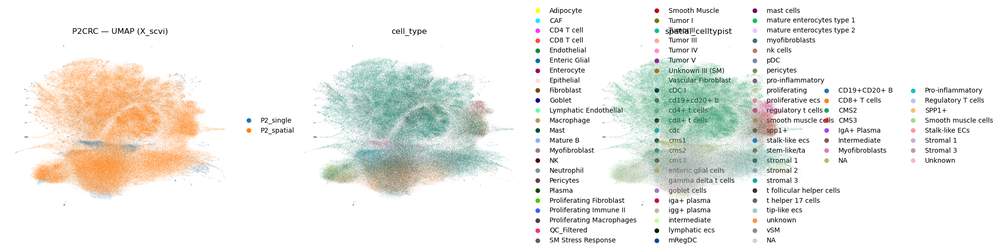

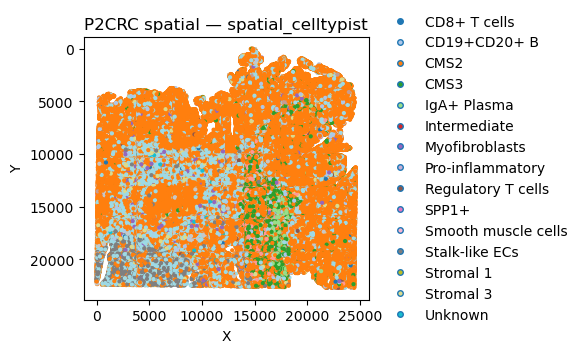


▶ P5CRC


FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'P5CRC_integrated_harmony_with_X_scvi.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [10]:
import scanpy as sc, numpy as np, matplotlib.pyplot as plt, pandas as pd, glob, re

INTEGRATED_FILES = {
    "P2CRC": "P2CRC_integrated_harmony_with_X_scvi.h5ad",
    "P5CRC": "P5CRC_integrated_harmony_with_X_scvi.h5ad",
}

LABEL_SC = "cell_type"            # from single-cell
LABEL_SP = "spatial_celltypist"   # from CellTypist
EMBED    = "X_scvi"               # latent already in your files

SC_ALL   = sc.read_h5ad("P2P5_labeled.h5ad")                # both SC patients
SP_ALL   = sc.concat([sc.read_h5ad(f)                       # all CellTypist slides
                      for f in glob.glob("*_spatial*_celltypist.h5ad")])

def normalise_suffix(adata):
    adata.obs_names = adata.obs_names.str.replace(r"-\d+$", "-1", regex=True)
    return adata[~adata.obs_names.duplicated()].copy()

def outside_legend(axis, categories, cmap):
    handles = [plt.Line2D([], [], marker="o", linestyle="", markersize=4,
                          markerfacecolor=cmap(i/len(categories)), label=cat)
               for i, cat in enumerate(categories)]
    axis.legend(handles=handles, bbox_to_anchor=(1.04, 0.5),
                loc="center left", frameon=False, borderaxespad=0)

for tag, integ_path in INTEGRATED_FILES.items():
    print(f"\n{tag}")

    adata_int = sc.read_h5ad(integ_path)
    adata_int.obs_names_make_unique()                  # ensure unique indices

    # single-cell rows for this patient
    sc_sub = SC_ALL[SC_ALL.obs["patient"] == tag].copy()
    sp_sub = SP_ALL[SP_ALL.obs["patient"] == tag].copy()

    sc_sub  = normalise_suffix(sc_sub)
    sp_sub  = normalise_suffix(sp_sub)

    for col in (LABEL_SC, LABEL_SP):
        adata_int.obs[col] = adata_int.obs.get(
            col, pd.Series(["NA"]*adata_int.n_obs, index=adata_int.obs_names)
        ).astype("object")

    sc_ix = sc_sub.obs_names.intersection(adata_int.obs_names)
    sp_ix = sp_sub.obs_names.intersection(adata_int.obs_names)

    adata_int.obs.loc[sc_ix, LABEL_SC] = sc_sub.obs.loc[sc_ix, LABEL_SC].astype(str).values
    adata_int.obs.loc[sp_ix, LABEL_SP] = sp_sub.obs.loc[sp_ix, LABEL_SP].astype(str).values

    adata_int.obs[LABEL_SC] = adata_int.obs[LABEL_SC].astype("category")
    adata_int.obs[LABEL_SP] = adata_int.obs[LABEL_SP].astype("category")

    print(f"  copied {len(sc_ix)} single-cell labels and {len(sp_ix)} spatial labels")

    sc.pp.neighbors(adata_int, use_rep=EMBED)
    sc.tl.umap(adata_int)
    sc.pl.umap(
        adata_int,
        color=["source", LABEL_SC, LABEL_SP],
        legend_loc="right margin",
        ncols=3, frameon=False,
        title=f"{tag} — UMAP ({EMBED})",
        show=True
    )

    xy  = np.asarray(sp_sub.obsm["spatial"])
    lab = sp_sub.obs[LABEL_SP].astype("category")

    fig, ax = plt.subplots(figsize=(6,6))
    sca = ax.scatter(xy[:,0], xy[:,1], s=4,
                     c=lab.cat.codes, cmap="tab20", rasterized=True)
    ax.invert_yaxis(); ax.set_aspect("equal")
    ax.set_xlabel("X"); ax.set_ylabel("Y")
    ax.set_title(f"{tag} spatial — {LABEL_SP}")
    outside_legend(ax, lab.cat.categories, plt.cm.tab20)
    plt.tight_layout(); plt.show()

    # optional: save updated file
    # adata_int.write_h5ad(f"{tag}_integrated_with_labels.h5ad", compression="gzip")


In [5]:
print(adata_combined.obsm.keys())

NameError: name 'adata_combined' is not defined

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Copied 6857 SC labels and 287908 spatial labels.


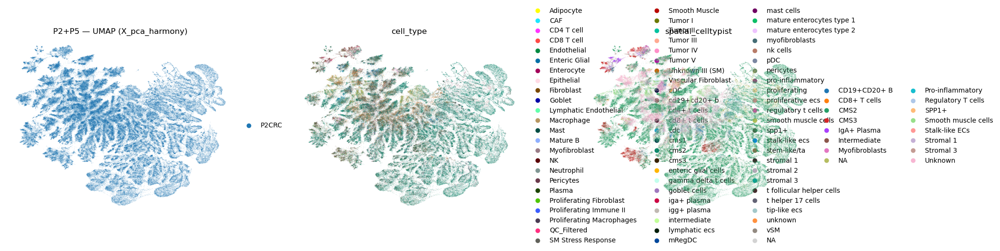

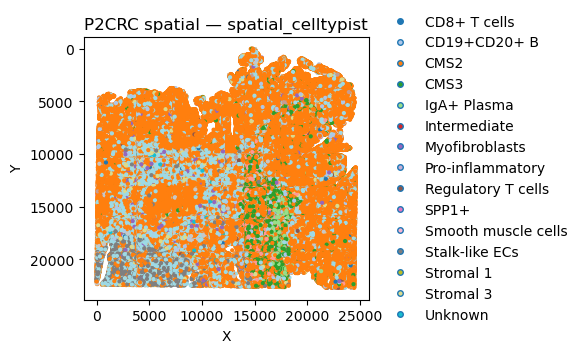

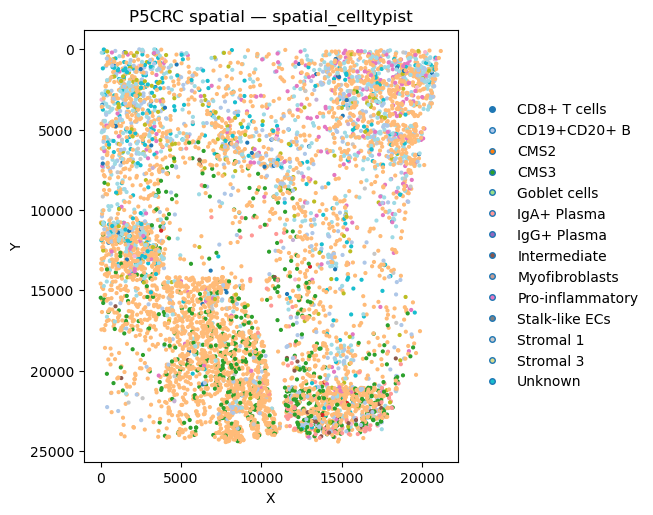

In [9]:
import scanpy as sc, numpy as np, matplotlib.pyplot as plt, glob, os
import harmonypy as hm          # comment out if you only want scVI
import scvi                     # comment out if you only want Harmony
import pandas as pd, re

joint_h5 = "P2CRC_integrated_harmony.h5ad"        # your joint object (raw counts & log-norm)

LABEL_SC = "cell_type"
LABEL_SP = "spatial_celltypist"
EMBED    = "X_pca_harmony"              # or "X_pca_harmony"

# ─── 0. load joint object ──────────────────────────────────────────
adata_int = sc.read_h5ad(joint_h5)

# ─── 1. create embedding if missing ───────────────────────────────
if EMBED not in adata_int.obsm:

    if EMBED == "X_pca_harmony":
        # run PCA if needed
        if "X_pca" not in adata_int.obsm:
            sc.pp.pca(adata_int, n_comps=50, svd_solver="arpack")
        # Harmony on the PCA, batch key = 'source'
        h_out = hm.run_harmony(adata_int.obsm["X_pca"], adata_int.obs, vars_use=["source"])
        adata_int.obsm[EMBED] = h_out.Z_corr.T
        print("Harmony PCs computed and stored as", EMBED)

    elif EMBED == "X_scvi":
        # minimal scVI (counts layer must exist or use raw)
        if "counts" not in adata_int.layers:
            adata_int.layers["counts"] = adata_int.X.copy()
        scvi.model.SCVI.setup_anndata(adata_int, layer="counts", batch_key="source")
        vae = scvi.model.SCVI(adata_int, n_latent=30, n_layers=2)
        vae.train(max_epochs=40)       # GPU: ~2 min, CPU: ~10 min
        adata_int.obsm[EMBED] = vae.get_latent_representation()
        print("cVI latent computed and stored as", EMBED)

    else:
        raise ValueError(f"Unknown EMBED '{EMBED}'")

    # save so you don’t lose it again
    base, ext = os.path.splitext(joint_h5)
    adata_int.write_h5ad(f"{base}_with_{EMBED}{ext}", compression="gzip")
    print("File saved with new embedding")

# ─── 2. load modality-specific label sources  ─────────────────────
adata_sc = sc.read_h5ad("P2P5_labeled.h5ad")
adata_sp = sc.concat([sc.read_h5ad(f) for f in glob.glob("*_spatial*_celltypist.h5ad")])

# harmonise suffixes; drop duplicates
adata_sc.obs_names = adata_sc.obs_names.str.replace(r"-\d+$", "-1", regex=True)
adata_sc = adata_sc[~adata_sc.obs_names.duplicated()].copy()
adata_sp = adata_sp[~adata_sp.obs_names.duplicated()].copy()

# ensure integrated index unique
adata_int.obs_names_make_unique()

# ─── 3. copy labels (cast to object first to avoid category clash) ───────
for col in [LABEL_SC, LABEL_SP]:
    adata_int.obs[col] = adata_int.obs.get(col, pd.Series(["NA"]*adata_int.n_obs,
                                                          index=adata_int.obs_names)).astype("object")

sc_overlap = adata_sc.obs_names.intersection(adata_int.obs_names)
sp_overlap = adata_sp.obs_names.intersection(adata_int.obs_names)

adata_int.obs.loc[sc_overlap, LABEL_SC] = adata_sc.obs.loc[sc_overlap, LABEL_SC].astype(str).values
adata_int.obs.loc[sp_overlap, LABEL_SP] = adata_sp.obs.loc[sp_overlap, LABEL_SP].astype(str).values

adata_int.obs[LABEL_SC] = adata_int.obs[LABEL_SC].astype("category")
adata_int.obs[LABEL_SP] = adata_int.obs[LABEL_SP].astype("category")

print(f"Copied {len(sc_overlap)} SC labels and {len(sp_overlap)} spatial labels.")

# ─── 4. neighbours / UMAP & plots ────────────────────────────────────────
sc.pp.neighbors(adata_int, use_rep=EMBED)
sc.tl.umap(adata_int)
sc.pl.umap(adata_int,
           color=["patient", LABEL_SC, LABEL_SP],
           legend_loc="right margin",
           ncols=3, frameon=False, show=True,
           title=f"P2+P5 — UMAP ({EMBED})")

for tag in ["P2CRC", "P5CRC"]:
    slide = adata_sp[adata_sp.obs["patient"] == tag]
    xy  = np.asarray(slide.obsm["spatial"])
    lab = slide.obs[LABEL_SP].astype("category")
    plt.figure(figsize=(6,6))
    plt.scatter(xy[:,0], xy[:,1], s=4,
                c=lab.cat.codes, cmap="tab20", rasterized=True)
    plt.gca().invert_yaxis(); plt.gca().set_aspect("equal")
    plt.xlabel("X"); plt.ylabel("Y")
    plt.title(f"{tag} spatial — {LABEL_SP}")
    # side legend
    handles = [plt.Line2D([], [], marker="o", markersize=4, linestyle="",
                          markerfacecolor=plt.cm.tab20(i/len(lab.cat.categories)),
                          label=c) for i,c in enumerate(lab.cat.categories)]
    plt.legend(handles=handles, bbox_to_anchor=(1.04,0.5),
               loc="center left", frameon=False, borderaxespad=0)
    plt.tight_layout()
    plt.show()


In [13]:
import scanpy as sc, numpy as np, matplotlib.pyplot as plt, glob, pandas as pd, re

# --------------------------------------------------------------------------
INTEGRATED = {          # paths of *per-patient* integrated files
    "P2CRC": "P2CRC_integrated_harmony_with_X_scvi.h5ad",
    "P5CRC": "P5CRC_integrated_harmony_with_X_scvi.h5ad",
}

LABEL_SC = "cell_type"            # from single-cell metadata
LABEL_SP = "spatial_celltypist"   # from CellTypist
EMBED    = "X_scvi"               # already present in those files

# full single-cell metadata
SC_ALL = sc.read_h5ad("P2P5_labeled.h5ad")

# all CellTypist slides
SP_ALL = sc.concat([sc.read_h5ad(f)
                    for f in glob.glob("*_spatial*_celltypist.h5ad")])

def harmonise_suffix(adata):
    """change -11/-12/... → -1, then drop duplicates"""
    adata.obs_names = adata.obs_names.str.replace(r"-\d+$", "-1", regex=True)
    return adata[~adata.obs_names.duplicated()].copy()

def side_legend(ax, categories, cmap):
    handles = [plt.Line2D([], [], marker="o", linestyle="", markersize=4,
                          markerfacecolor=cmap(i / len(categories)),
                          label=cat)
               for i, cat in enumerate(categories)]
    ax.legend(handles=handles, bbox_to_anchor=(1.04, 0.5),
              loc="center left", frameon=False, borderaxespad=0)

for tag, path in INTEGRATED.items():
    print(f"\n▶  {tag}")

    ad = sc.read_h5ad(path)
    ad.obs_names_make_unique()

    sc_sub = harmonise_suffix(SC_ALL[SC_ALL.obs["patient"] == tag])
    sp_sub = harmonise_suffix(SP_ALL[SP_ALL.obs["patient"] == tag])

    for col in (LABEL_SC, LABEL_SP):
        ad.obs[col] = ad.obs.get(col,
                                 pd.Series(["NA"] * ad.n_obs,
                                           index=ad.obs_names)).astype("object")

    sc_ix = sc_sub.obs_names.intersection(ad.obs_names)
    sp_ix = sp_sub.obs_names.intersection(ad.obs_names)
    ad.obs.loc[sc_ix, LABEL_SC] = sc_sub.obs.loc[sc_ix, LABEL_SC].astype(str).values
    ad.obs.loc[sp_ix, LABEL_SP] = sp_sub.obs.loc[sp_ix, LABEL_SP].astype(str).values
    ad.obs[LABEL_SC] = ad.obs[LABEL_SC].astype("category")
    ad.obs[LABEL_SP] = ad.obs[LABEL_SP].astype("category")

    print(f"   copied {len(sc_ix)} single-cell labels, "
          f"{len(sp_ix)} spatial labels")

    sc.pp.neighbors(ad, use_rep=EMBED)
    sc.tl.umap(ad)
    sc.pl.umap(
        ad,
        color=["source", LABEL_SC, LABEL_SP],
        legend_loc="right margin",
        ncols=3, frameon=False, show=True,
        title=f"{tag} — UMAP ({EMBED})"
    )

    xy  = np.asarray(sp_sub.obsm["spatial"])
    lab = sp_sub.obs[LABEL_SP].astype("category")
    fig, ax = plt.subplots(figsize=(6,6))
    ax.scatter(xy[:,0], xy[:,1], s=4,
               c=lab.cat.codes, cmap="tab20", rasterized=True)
    ax.invert_yaxis(); ax.set_aspect("equal")
    ax.set_xlabel("X"); ax.set_ylabel("Y")
    ax.set_title(f"{tag} spatial — {LABEL_SP}")
    side_legend(ax, lab.cat.categories, plt.cm.tab20)
    plt.tight_layout(); plt.show()

    # optional: save updated file
    # ad.write_h5ad(f"{tag}_integrated_with_labels.h5ad", compression="gzip")


/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")



▶  P2CRC
   copied 6857 single-cell labels, 287908 spatial labels


KeyboardInterrupt: 

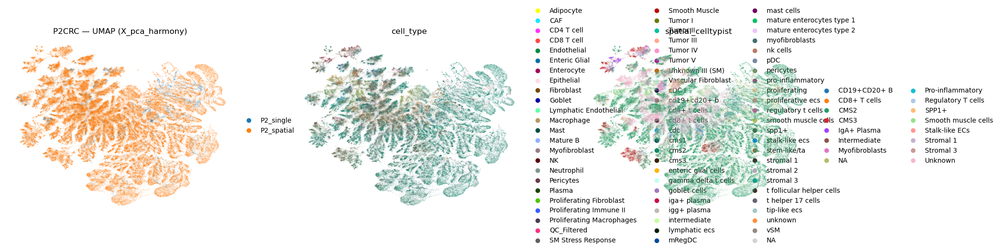

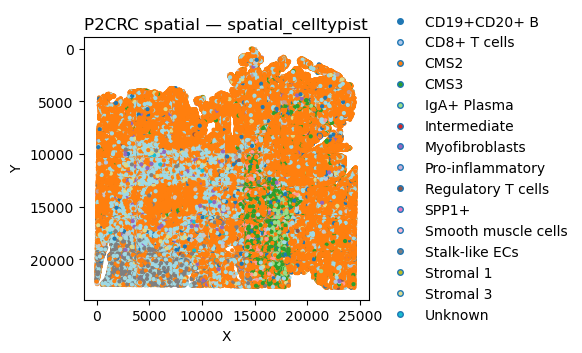

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'P5CRC_integrated_harmony_with_X_scvi.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [14]:
import glob, scanpy as sc, numpy as np, matplotlib.pyplot as plt, pandas as pd, re

LABEL_SC = "cell_type"
LABEL_SP = "spatial_celltypist"
EMBED    = "X_pca_harmony"        # or "X_scvi" if you prefer

def drop_dups(adata):
    if adata.obs_names.has_duplicates:
        adata._inplace_subset_obs(~adata.obs_names.duplicated())
    return adata

def norm_suffix(adata):
    adata.obs_names = adata.obs_names.str.replace(r"-\d+$", "-1", regex=True)
    return drop_dups(adata)

def side_legend(ax, categories, cmap):
    handles = [plt.Line2D([], [], marker="o", linestyle="", markersize=4,
                          markerfacecolor=cmap(i/len(categories)), label=cat)
               for i, cat in enumerate(categories)]
    ax.legend(handles=handles, bbox_to_anchor=(1.04,0.5),
              loc="center left", frameon=False, borderaxespad=0)

for tag in ["P2CRC", "P5CRC"]:

    ad_int = sc.read_h5ad(f"{tag}_integrated_harmony_with_X_scvi.h5ad")
    ad_sc  = norm_suffix(sc.read_h5ad("P2P5_labeled.h5ad"))
    ad_sp  = norm_suffix(sc.read_h5ad(glob.glob(f"{tag}_spatial*_celltypist.h5ad")[0]))

    # unique integrated barcodes
    ad_int.obs_names_make_unique()

    # copy labels
    for col in (LABEL_SC, LABEL_SP):
        ad_int.obs[col] = ad_int.obs.get(col,
            pd.Series(["NA"]*ad_int.n_obs, index=ad_int.obs_names)).astype("object")

    sc_ix = ad_sc.obs_names.intersection(ad_int.obs_names)
    sp_ix = ad_sp.obs_names.intersection(ad_int.obs_names)
    ad_int.obs.loc[sc_ix, LABEL_SC] = ad_sc.obs.loc[sc_ix, LABEL_SC].astype(str).values
    ad_int.obs.loc[sp_ix, LABEL_SP] = ad_sp.obs.loc[sp_ix, LABEL_SP].astype(str).values
    ad_int.obs[LABEL_SC] = ad_int.obs[LABEL_SC].astype("category")
    ad_int.obs[LABEL_SP] = ad_int.obs[LABEL_SP].astype("category")

    sc.pp.neighbors(ad_int, use_rep=EMBED)
    sc.tl.umap(ad_int)
    sc.pl.umap(ad_int,
               color=["source", LABEL_SC, LABEL_SP],
               legend_loc="right margin", ncols=3, frameon=False,
               title=f"{tag} — UMAP ({EMBED})",
               show=True)

    xy  = np.asarray(ad_sp.obsm["spatial"])
    lab = ad_sp.obs[LABEL_SP].astype("category")
    fig, ax = plt.subplots(figsize=(6,6))
    ax.scatter(xy[:,0], xy[:,1], s=4, c=lab.cat.codes,
               cmap="tab20", rasterized=True)
    ax.invert_yaxis(); ax.set_aspect("equal")
    ax.set_xlabel("X"); ax.set_ylabel("Y")
    ax.set_title(f"{tag} spatial — {LABEL_SP}")
    side_legend(ax, lab.cat.categories, plt.cm.tab20)
    plt.tight_layout(); plt.show()


/scratch/ipykernel_671660/3629124541.py:27: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = sc_ref.concatenate(


P2CRC concatenated: (315763, 278)


2025-07-02 10:48:18,270 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-07-02 10:49:01,891 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-07-02 10:49:02,403 - harmonypy - INFO - Iteration 1 of 10
2025-07-02 10:50:14,880 - harmonypy - INFO - Iteration 2 of 10
2025-07-02 10:51:27,356 - harmonypy - INFO - Iteration 3 of 10
2025-07-02 10:52:38,907 - harmonypy - INFO - Iteration 4 of 10
2025-07-02 10:53:34,316 - harmonypy - INFO - Iteration 5 of 10
2025-07-02 10:54:36,070 - harmonypy - INFO - Iteration 6 of 10
2025-07-02 10:55:30,171 - harmonypy - INFO - Converged after 6 iterations


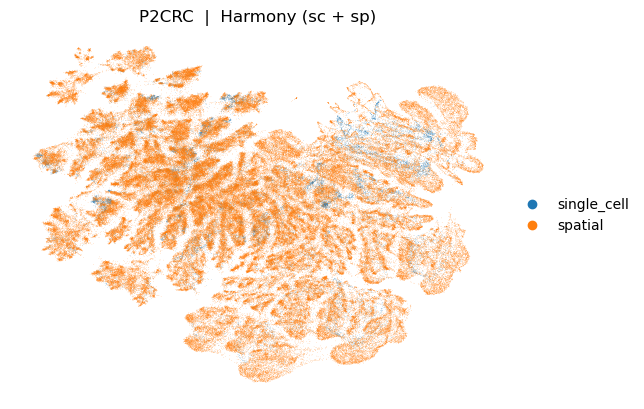

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /nfs/home/jjoseph/.local/lib/python3.10/site-package ...
GPU available: True (cuda), used: True
TPU available: False, 

Epoch 1/40:   0%|                                 | 0/40 [00:00<?, ?it/s]

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 2/40:   2%| | 1/40 [00:21<13:53, 21.37s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 3/40:   5%| | 2/40 [00:39<12:28, 19.70s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 4/40:   8%| | 3/40 [00:58<11:58, 19.41s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 5/40:  10%| | 4/40 [01:17<11:27, 19.09s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 6/40:  12%|▏| 5/40 [01:36<11:02, 18.92s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 7/40:  15%|▏| 6/40 [01:54<10:31, 18.58s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 8/40:  18%|▏| 7/40 [02:11<09:55, 18.06s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 9/40:  20%|▏| 8/40 [02:27<09:19, 17.49s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 10/40:  22%|▏| 9/40 [02:45<09:09, 17.72s/it, v_num=1, train_loss_st

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 11/40:  25%|▎| 10/40 [03:03<08:50, 17.68s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 12/40:  28%|▎| 11/40 [03:21<08:37, 17.85s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 13/40:  30%|▎| 12/40 [03:39<08:19, 17.85s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 14/40:  32%|▎| 13/40 [03:55<07:51, 17.48s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 15/40:  35%|▎| 14/40 [04:12<07:31, 17.36s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 16/40:  38%|▍| 15/40 [04:29<07:08, 17.15s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 17/40:  40%|▍| 16/40 [04:48<07:03, 17.65s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 18/40:  42%|▍| 17/40 [05:07<06:54, 18.03s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 19/40:  45%|▍| 18/40 [05:26<06:41, 18.25s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 20/40:  48%|▍| 19/40 [05:44<06:21, 18.19s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 21/40:  50%|▌| 20/40 [06:01<06:00, 18.03s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 22/40:  52%|▌| 21/40 [06:19<05:38, 17.84s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 23/40:  55%|▌| 22/40 [06:36<05:19, 17.75s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 24/40:  57%|▌| 23/40 [06:54<05:00, 17.67s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 25/40:  60%|▌| 24/40 [07:11<04:41, 17.61s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 26/40:  62%|▋| 25/40 [07:30<04:27, 17.86s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 27/40:  65%|▋| 26/40 [07:48<04:11, 18.00s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 28/40:  68%|▋| 27/40 [08:05<03:49, 17.66s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 29/40:  70%|▋| 28/40 [08:22<03:29, 17.47s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 30/40:  72%|▋| 29/40 [08:38<03:08, 17.10s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 31/40:  75%|▊| 30/40 [08:56<02:54, 17.49s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 32/40:  78%|▊| 31/40 [09:15<02:39, 17.68s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 33/40:  80%|▊| 32/40 [09:31<02:17, 17.23s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 34/40:  82%|▊| 33/40 [09:48<01:59, 17.07s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 35/40:  85%|▊| 34/40 [10:05<01:43, 17.23s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 36/40:  88%|▉| 35/40 [10:24<01:28, 17.62s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 37/40:  90%|▉| 36/40 [10:40<01:08, 17.25s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 38/40:  92%|▉| 37/40 [10:56<00:50, 16.93s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 39/40:  95%|▉| 38/40 [11:13<00:34, 17.02s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 40/40:  98%|▉| 39/40 [11:32<00:17, 17.37s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 40/40: 100%|█| 40/40 [11:48<00:00, 17.13s/it, v_num=1, train_loss_s

`Trainer.fit` stopped: `max_epochs=40` reached.


Epoch 40/40: 100%|█| 40/40 [11:48<00:00, 17.72s/it, v_num=1, train_loss_s


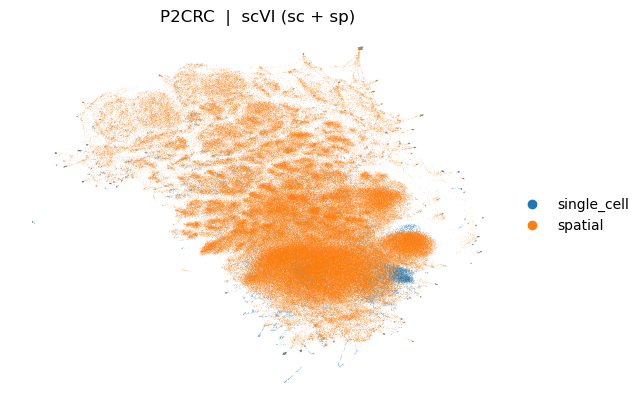

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


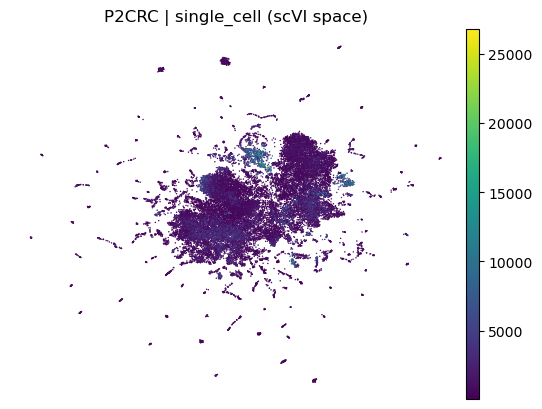

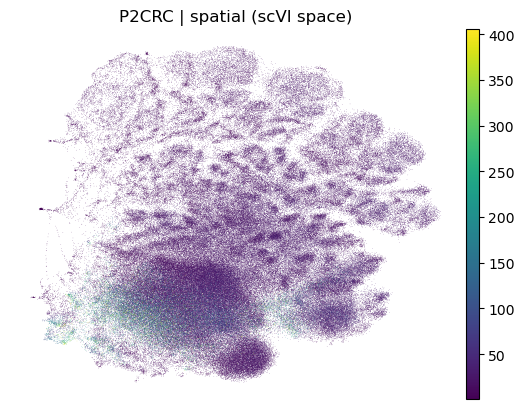

P2CRC: all figures plotted.



/scratch/ipykernel_671660/3629124541.py:27: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = sc_ref.concatenate(


P5CRC concatenated: (272162, 205)


2025-07-02 11:18:11,463 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-07-02 11:18:53,537 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-07-02 11:18:53,983 - harmonypy - INFO - Iteration 1 of 10
2025-07-02 11:19:55,498 - harmonypy - INFO - Iteration 2 of 10
2025-07-02 11:20:56,861 - harmonypy - INFO - Iteration 3 of 10
2025-07-02 11:21:59,959 - harmonypy - INFO - Iteration 4 of 10
2025-07-02 11:23:01,467 - harmonypy - INFO - Iteration 5 of 10
2025-07-02 11:24:04,279 - harmonypy - INFO - Iteration 6 of 10
2025-07-02 11:25:06,639 - harmonypy - INFO - Converged after 6 iterations


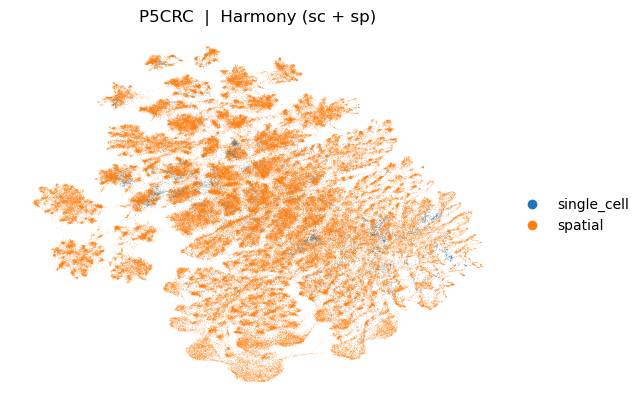

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /nfs/home/jjoseph/.local/lib/python3.10/site-package ...
GPU available: True (cuda), used: True
TPU available: False, 

Epoch 1/40:   0%|                                 | 0/40 [00:00<?, ?it/s]

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 2/40:   2%| | 1/40 [00:13<08:29, 13.05s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 3/40:   5%| | 2/40 [00:25<08:07, 12.83s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 4/40:   8%| | 3/40 [00:37<07:41, 12.47s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 5/40:  10%| | 4/40 [00:50<07:38, 12.73s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 6/40:  12%|▏| 5/40 [01:07<08:15, 14.15s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 7/40:  15%|▏| 6/40 [01:22<08:11, 14.46s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 8/40:  18%|▏| 7/40 [01:35<07:40, 13.94s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 9/40:  20%|▏| 8/40 [01:49<07:24, 13.88s/it, v_num=1, train_loss_ste

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 10/40:  22%|▏| 9/40 [02:03<07:10, 13.88s/it, v_num=1, train_loss_st

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 11/40:  25%|▎| 10/40 [02:17<07:00, 14.02s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 12/40:  28%|▎| 11/40 [02:32<06:54, 14.31s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 13/40:  30%|▎| 12/40 [02:44<06:22, 13.64s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 14/40:  32%|▎| 13/40 [02:56<05:54, 13.14s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 15/40:  35%|▎| 14/40 [03:08<05:33, 12.84s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 16/40:  38%|▍| 15/40 [03:20<05:10, 12.44s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 17/40:  40%|▍| 16/40 [03:31<04:52, 12.18s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 18/40:  42%|▍| 17/40 [03:43<04:37, 12.06s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 19/40:  45%|▍| 18/40 [03:56<04:28, 12.19s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 20/40:  48%|▍| 19/40 [04:09<04:22, 12.48s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 21/40:  50%|▌| 20/40 [04:21<04:11, 12.55s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 22/40:  52%|▌| 21/40 [04:34<04:01, 12.69s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 23/40:  55%|▌| 22/40 [04:52<04:15, 14.18s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 24/40:  57%|▌| 23/40 [05:08<04:10, 14.74s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 25/40:  60%|▌| 24/40 [05:24<04:02, 15.13s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 26/40:  62%|▋| 25/40 [05:37<03:37, 14.50s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 27/40:  65%|▋| 26/40 [05:51<03:18, 14.21s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 28/40:  68%|▋| 27/40 [06:05<03:03, 14.12s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 29/40:  70%|▋| 28/40 [06:19<02:49, 14.13s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 30/40:  72%|▋| 29/40 [06:34<02:38, 14.37s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 31/40:  75%|▊| 30/40 [06:46<02:16, 13.66s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 32/40:  78%|▊| 31/40 [06:58<01:59, 13.28s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 33/40:  80%|▊| 32/40 [07:11<01:45, 13.24s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 34/40:  82%|▊| 33/40 [07:24<01:30, 12.94s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 35/40:  85%|▊| 34/40 [07:36<01:16, 12.69s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 36/40:  88%|▉| 35/40 [07:48<01:02, 12.54s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 37/40:  90%|▉| 36/40 [08:00<00:49, 12.38s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 38/40:  92%|▉| 37/40 [08:12<00:36, 12.26s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 39/40:  95%|▉| 38/40 [08:24<00:24, 12.16s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 40/40:  98%|▉| 39/40 [08:36<00:12, 12.09s/it, v_num=1, train_loss_s

/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scvi/module/_vae.py:573: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)


Epoch 40/40: 100%|█| 40/40 [08:47<00:00, 11.94s/it, v_num=1, train_loss_s

`Trainer.fit` stopped: `max_epochs=40` reached.


Epoch 40/40: 100%|█| 40/40 [08:47<00:00, 13.19s/it, v_num=1, train_loss_s


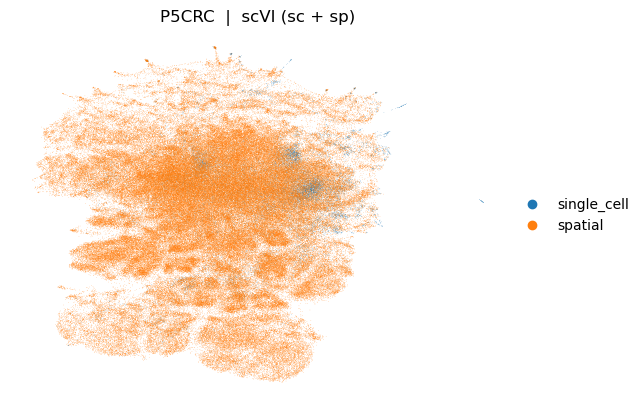

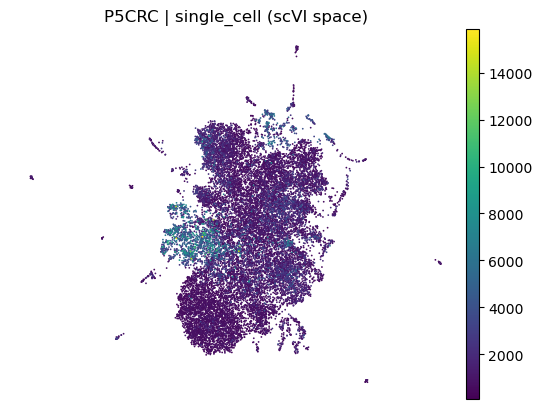

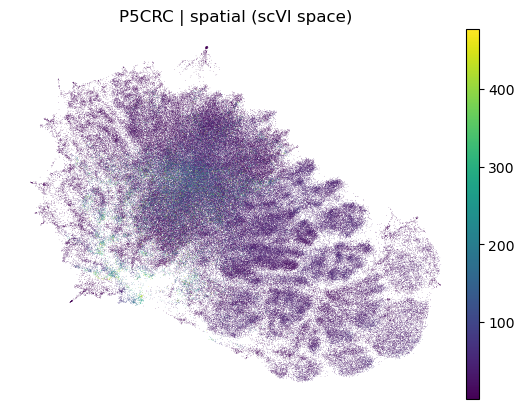

P5CRC: all figures plotted.



In [4]:
import scanpy as sc, numpy as np, harmonypy as hm, scvi
import matplotlib.pyplot as plt


files = {
    "P2CRC": {
        "single": "P2CRC_clean.h5ad",
        "spatial": "p2_enact_manual_clean.h5ad",
    },
    "P5CRC": {
        "single": "P5CRC_clean.h5ad",
        "spatial": "p5_enact_manual_clean.h5ad",
    },
}

def integrate_sc_and_sp(single_h5, spatial_h5, tag):
    # ── 1. Load data ─────────────────────────────────────────────────
    sc_ref = sc.read_h5ad(single_h5)
    sp_ref = sc.read_h5ad(spatial_h5)

    # ── 2. Gene intersection ────────────────────────────────────────
    shared = sc_ref.var_names.intersection(sp_ref.var_names)
    sc_ref = sc_ref[:, shared].copy()
    sp_ref = sp_ref[:, shared].copy()

    # ── 3. Concatenate without clobbering the labels we need ────────
    adata = sc_ref.concatenate(
        sp_ref,
        batch_key="batch",                       # <── NEW name
        batch_categories=["single_cell", "spatial"],
        index_unique=None,
        uns_merge="unique"
    )
    adata.obs["source"] = adata.obs["batch"].astype("category")  # keep old name
    del adata.obs["batch"]

    print(f"{tag} concatenated:", adata.shape)

    # ── 4. Store raw counts layer (if missing) ──────────────────────
    if "counts" not in adata.layers:
        adata.layers["counts"] = adata.X.copy()

    # ── 5. Harmony integration ──────────────────────────────────────
    sc.pp.pca(adata, n_comps=50, svd_solver="arpack")
    ho = hm.run_harmony(adata.obsm["X_pca"], adata.obs, vars_use=["source"])
    adata.obsm["X_pca_harmony"] = ho.Z_corr.T
    sc.pp.neighbors(adata, use_rep="X_pca_harmony")
    sc.tl.umap(adata)
    sc.pl.umap(
        adata, color="source",
        title=f"{tag}  |  Harmony (sc + sp)",
        frameon=False, show=True
    )
    adata.write_h5ad(f"{tag}_integrated_harmony.h5ad", compression="gzip")

    # ── 6. scVI integration ─────────────────────────────────────────
    scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="source")
    vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30)
    vae.train(max_epochs=40)
    adata.obsm["X_scvi"] = vae.get_latent_representation()
    sc.pp.neighbors(adata, use_rep="X_scvi")
    sc.tl.umap(adata)
    sc.pl.umap(
        adata, color="source",
        title=f"{tag}  |  scVI (sc + sp)",
        frameon=False, show=True
    )
    adata.write_h5ad(f"{tag}_integrated_scvi.h5ad", compression="gzip")

    # ── 7. Per-modality UMAPs in the scVI space ─────────────────────
    for src in ["single_cell", "spatial"]:
        sub = adata[adata.obs["source"] == src].copy()
        if sub.n_obs < 2:
            print(f"{tag} | {src}: only {sub.n_obs} cell(s); skipping UMAP.")
            continue
        sc.pp.neighbors(sub, use_rep="X_scvi", n_neighbors=min(15, sub.n_obs-1))
        sc.tl.umap(sub)
        sc.pl.umap(
            sub, color="total_counts",
            title=f"{tag} | {src} (scVI space)",
            frameon=False, show=True
        )
    print(f"{tag}: all figures plotted.\n")

# run for both patients
for tag, paths in files.items():
    integrate_sc_and_sp(paths["single"], paths["spatial"], tag=tag)


In [9]:
import scanpy as sc, pandas as pd, matplotlib.pyplot as plt, numpy as np
import glob, re, harmonypy as hm

INT = {"P2CRC": "P2CRC_integrated_harmony.h5ad",
       "P5CRC": "P5CRC_integrated_harmony.h5ad"}
SC_FULL = sc.read_h5ad("P2P5_labeled.h5ad")
SLIDE = {t: glob.glob(f"{t}_spatial*_celltypist.h5ad")[0] for t in INT}

LABEL_SC, NEW_KEY, EMBED = "cell_type", "cell_type_ingest", "X_pca_harmony"

def norm(a):
    a.obs_names = a.obs_names.str.replace(r"-\\d+$", "-1", regex=True)
    return a[~a.obs_names.duplicated()].copy()

def ingest_1nn(tgt, ref):
    g = ref.var_names.intersection(tgt.var_names)
    ref, tgt = ref[:, g].copy(), tgt[:, g].copy()
    sc.pp.pca(ref, n_comps=50); sc.pp.neighbors(ref, n_neighbors=5)
    sc.tl.ingest(tgt, ref, obs=LABEL_SC, labeling_method="knn")
    s = tgt.obs[LABEL_SC].astype(str).fillna("NA")
    tgt.obs[NEW_KEY] = pd.Categorical(s.reindex(tgt.obs_names))

def ensure_harmony(ad):
    if EMBED in ad.obsm: return
    if "X_pca" not in ad.obsm: sc.pp.pca(ad, n_comps=50)
    ho = hm.run_harmony(ad.obsm["X_pca"], ad.obs, vars_use=["source"])
    ad.obsm[EMBED] = ho.Z_corr.T

for tag, fn in INT.items():
    print(tag)
    ad = sc.read_h5ad(fn); ad.obs_names_make_unique()

    if NEW_KEY not in ad.obs:
        ref = norm(SC_FULL[SC_FULL.obs["patient"] == tag])
        ingest_1nn(ad, ref)
        print("  added", NEW_KEY)

    ensure_harmony(ad)

    # ---- drop illegal obs columns ----------------
    bad = [c for c in ad.obs.columns if c.startswith("_index")]
    if bad:
        print("  removing obs columns:", bad)
        ad.obs.drop(columns=bad, inplace=True)

    ad.write_h5ad(fn, compression="gzip")         # now succeeds
    print("  file saved")

    # ---- UMAP ------------------------------------
    sc.pp.neighbors(ad, use_rep=EMBED); sc.tl.umap(ad)
    sc.pl.umap(ad, color=NEW_KEY, legend_loc="right margin",
               frameon=False, title=f"{tag} — UMAP (Harmony)", show=True)

    # ---- spatial X-Y -----------------------------
    slide = norm(sc.read_h5ad(SLIDE[tag]))
    labs  = ad.obs[NEW_KEY].reindex(slide.obs_names).astype("category")
    xy = slide.obsm["spatial"]; cats = labs.cat.categories
    cmap = plt.cm.get_cmap("tab20", len(cats))
    plt.figure(figsize=(6,6))
    plt.scatter(xy[:,0], xy[:,1], s=2, c=cmap(labs.cat.codes), rasterized=True)
    plt.gca().invert_yaxis(); plt.gca().set_aspect("equal")
    plt.xlabel("X"); plt.ylabel("Y"); plt.title(f"{tag} spatial — {NEW_KEY}")
    plt.legend([plt.Line2D([],[],marker='o',linestyle='',markersize=4,
                           markerfacecolor=cmap(i), label=c)
                for i,c in enumerate(cats)],
               bbox_to_anchor=(1.04,.5), loc="center left", frameon=False)
    plt.tight_layout(); plt.show()


P2CRC


FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'P2CRC_integrated_harmony.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [4]:
import scanpy as sc

# load your integrated object
ad = sc.read_h5ad("P2CRC_integrated_harmony.h5ad")

# list available embeddings
print("Available embeddings (ad.obsm keys):")



Available embeddings (ad.obsm keys):


TypeError: 'DataFrame' object is not callable

In [5]:
ad.obs

,_index,_scvi_batch,_scvi_labels,cell_type,cell_type_ingest,doublet,leiden_local,n_genes_by_counts,n_spatial_neighbors,patch_id,patient,patient_tag,pct_counts_mt,pct_counts_ribo,sample_id,source,suffix,total_counts,total_counts_mt,total_counts_ribo
0,AAACAAGCAACAGCTAACTTTAGG-1,0.0,0.0,NaN,,False,2,715,NaN,NaN,P2CRC,P2CRC,1.724138,0.000000,20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...,single_cell,1,1914.000000,33.0,0.0
1,AAACAAGCAACTGTTCACTTTAGG-1,0.0,0.0,NaN,,False,4,318,NaN,NaN,P2CRC,P2CRC,1.084011,0.000000,20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...,single_cell,1,369.000000,4.0,0.0
2,AAACAAGCAAGGCCTGACTTTAGG-1,0.0,0.0,NaN,,False,5,472,NaN,NaN,P2CRC,P2CRC,6.294964,0.179856,20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...,single_cell,1,556.000000,35.0,1.0
3,AAACAAGCAGGGCTATACTTTAGG-1,0.0,0.0,NaN,,False,4,935,NaN,NaN,P2CRC,P2CRC,3.107114,0.081766,20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...,single_cell,1,1223.000000,38.0,1.0
4,AAACAAGCATTGTGAGACTTTAGG-1,0.0,0.0,NaN,,False,10,267,NaN,NaN,P2CRC,P2CRC,1.351351,0.000000,20k_HumanColonCancer_Flex_Multiplex_P1L1_P2CRC...,single_cell,1,296.000000,4.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
315758,ID_99993,NaN,NaN,cms2,,<NA>,NaN,12,3.0,patch_2_2.csv,P2CRC,NaN,0.000000,0.000000,NaN,spatial,NaN,16.473146,0.0,0.0
315759,ID_99994,NaN,NaN,cms2,,<NA>,NaN,18,2.0,patch_2_2.csv,P2CRC,NaN,0.000000,0.000000,NaN,spatial,NaN,21.223341,0.0,0.0
315760,ID_99995,NaN,NaN,cms2,,<NA>,NaN,13,6.0,patch_2_2.csv,P2CRC,NaN,0.000000,0.000000,NaN,spatial,NaN,13.128080,0.0,0.0
315761,ID_99996,NaN,NaN,cms2,,<NA>,NaN,5,3.0,patch_2_2.csv,P2CRC,NaN,0.000000,0.000000,NaN,spatial,NaN,4.051109,0.0,0.0


In [10]:
import scanpy as sc, harmonypy as hm, numpy as np

sc.settings.verbosity = 1

# --- load QC-ed inputs -------------------------------------------------
sc_ref = sc.read_h5ad("P2CRC_clean.h5ad")
sp_ref = sc.read_h5ad("P2CRC_spatial_clean.h5ad")

shared = sc_ref.var_names.intersection(sp_ref.var_names)
sc_ref = sc_ref[:, shared].copy();  sc_ref.obs["source"] = "single"
sp_ref = sp_ref[:, shared].copy();  sp_ref.obs["source"] = "spatial"

adata  = sc_ref.concatenate(sp_ref, batch_key="source",
                            uns_merge="unique", index_unique=None)

# --- normalise / log1p if not already done ----------------------------
if "counts" not in adata.layers:
    adata.layers["counts"] = adata.X.copy()
    sc.pp.normalize_total(adata); sc.pp.log1p(adata)

# --- PCA + Harmony ----------------------------------------------------
sc.pp.pca(adata, n_comps=50)
ho = hm.run_harmony(adata.obsm["X_pca"], adata.obs, vars_use=["source"])
adata.obsm["X_pca_harmony"] = ho.Z_corr.T

# --- save (ATOMIC!) ---------------------------------------------------
tmp = "P2CRC_integrated_harmony.h5ad.tmp"
adata.write_h5ad(tmp, compression="gzip")
import pathlib; pathlib.Path(tmp).replace("P2CRC_integrated_harmony.h5ad")

print("✅ recreated P2CRC_integrated_harmony.h5ad")


FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'P2CRC_spatial_clean.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [ ]:
import scanpy as sc, pandas as pd, numpy as np, matplotlib.pyplot as plt
import glob, re, harmonypy as hm, pathlib

INT_FILE   = "P2CRC_integrated_harmony.h5ad"
SC_REF_ALL = sc.read_h5ad("P2P5_labeled.h5ad")
VISIUM     = glob.glob("P2CRC_spatial*_celltypist.h5ad")[0]

LABEL_SC, NEW_KEY, EMBED = "cell_type", "cell_type_ingest", "X_pca_harmony"

def norm(a):
    a.obs_names = a.obs_names.str.replace(r"-\d+$", "-1", regex=True)
    return a[~a.obs_names.duplicated()].copy()

def ingest_1nn(tgt, ref):
    g = ref.var_names.intersection(tgt.var_names)
    ref, tgt = ref[:, g].copy(), tgt[:, g].copy()
    sc.pp.pca(ref, n_comps=50); sc.pp.neighbors(ref, n_neighbors=5)
    sc.tl.ingest(tgt, ref, obs=LABEL_SC, labeling_method="knn")
    tgt.obs[NEW_KEY] = pd.Categorical(
        tgt.obs[LABEL_SC].astype(str).fillna("NA").reindex(tgt.obs_names))

ad = sc.read_h5ad(INT_FILE); ad.obs_names_make_unique()

if NEW_KEY not in ad.obs:
    ref = norm(SC_REF_ALL[SC_REF_ALL.obs["patient"] == "P2CRC"])
    ingest_1nn(ad, ref);  print("added", NEW_KEY)

if EMBED not in ad.obsm:
    if "X_pca" not in ad.obsm: sc.pp.pca(ad, n_comps=50)
    ho = hm.run_harmony(ad.obsm["X_pca"], ad.obs, vars_use=["source"])
    ad.obsm[EMBED] = ho.Z_corr.T

bad = [c for c in ad.obs.columns if c.lower().endswith("index")]
if bad: ad.obs.drop(columns=bad, inplace=True)

tmp = INT_FILE + ".tmp"
ad.write_h5ad(tmp, compression="gzip")
pathlib.Path(tmp).replace(INT_FILE)
print("file saved with labels ✓")

sc.pp.neighbors(ad, use_rep=EMBED); sc.tl.umap(ad)
sc.pl.umap(ad, color=NEW_KEY, legend_loc="right margin",
           frameon=False, title="P2CRC — UMAP (Harmony)", show=True)

slide = norm(sc.read_h5ad(VISIUM))
labs  = ad.obs[NEW_KEY].reindex(slide.obs_names).astype("category")
xy    = slide.obsm["spatial"]; cats = labs.cat.categories
cmap  = plt.cm.get_cmap("tab20", len(cats))
plt.figure(figsize=(6,6))
plt.scatter(xy[:,0], xy[:,1], s=2, c=cmap(labs.cat.codes), rasterized=True)
plt.gca().invert_yaxis(); plt.gca().set_aspect("equal")
plt.xlabel("X"); plt.ylabel("Y")
plt.title("P2CRC spatial — cell_type_ingest")
plt.legend([plt.Line2D([],[],marker='o',linestyle='',markersize=4,
                       markerfacecolor=cmap(i), label=c)
            for i,c in enumerate(cats)],
           bbox_to_anchor=(1.04,.5), loc="center left", frameon=False)
plt.tight_layout(); plt.show()


In [12]:
adata = sc.read_h5ad('P2CRC_integrated_harmony_corrupt.h5ad')
adata.obsm

KeyError: "Unable to synchronously open object (object 'obs' doesn't exist)"

/scratch/ipykernel_1723773/708711501.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = sc_ref.concatenate(


P2CRC: concatenated  →  (315763, 278)


2025-07-02 13:18:02,262 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-07-02 13:19:26,406 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-07-02 13:19:27,141 - harmonypy - INFO - Iteration 1 of 10
2025-07-02 13:21:15,712 - harmonypy - INFO - Iteration 2 of 10
2025-07-02 13:23:02,163 - harmonypy - INFO - Iteration 3 of 10
2025-07-02 13:24:20,004 - harmonypy - INFO - Iteration 4 of 10
2025-07-02 13:25:23,881 - harmonypy - INFO - Iteration 5 of 10
2025-07-02 13:27:05,349 - harmonypy - INFO - Iteration 6 of 10
2025-07-02 13:28:34,215 - harmonypy - INFO - Converged after 6 iterations


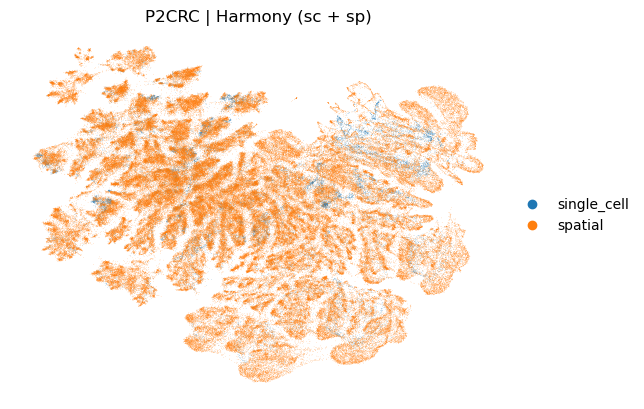

ValueError: ❌  'cell_type' not found in P2CRC_clean.h5ad

In [13]:
import scanpy as sc, numpy as np, harmonypy as hm, matplotlib.pyplot as plt


files = {
    "P2CRC": {
        "single":  "P2CRC_clean.h5ad",            # single-cell
        "spatial": "p2_enact_manual_clean.h5ad",  # Visium / ENACT
    },
    "P5CRC": {
        "single":  "P5CRC_clean.h5ad",
        "spatial": "p5_enact_manual_clean.h5ad",
    },
}

# name of the existing label column in the single-cell file
LABEL_SC  = "cell_type"        
NEW_LABEL = f"{LABEL_SC}_ingest" 


# per-patient integration + label transfer

def integrate_harmony_only(single_h5, spatial_h5, tag):
    # ── 1. load
    sc_ref = sc.read_h5ad(single_h5)
    sp_ref = sc.read_h5ad(spatial_h5)

    # intersect genes
    shared = sc_ref.var_names.intersection(sp_ref.var_names)
    sc_ref = sc_ref[:, shared].copy()
    sp_ref = sp_ref[:, shared].copy()

    # concatenate file
    adata = sc_ref.concatenate(
        sp_ref,
        batch_key="source",
        batch_categories=["single_cell", "spatial"],
        index_unique=None,
        uns_merge="unique",
    )
    print(f"{tag}: concatenated  →  {adata.shape}")

    # ensure raw counts layer
    if "counts" not in adata.layers:
        adata.layers["counts"] = adata.X.copy()
        sc.pp.normalize_total(adata)
        sc.pp.log1p(adata)

    # Harmony
    sc.pp.pca(adata, n_comps=50, svd_solver="arpack")
    ho = hm.run_harmony(adata.obsm["X_pca"], adata.obs, vars_use=["source"])
    adata.obsm["X_pca_harmony"] = ho.Z_corr.T
    sc.pp.neighbors(adata, use_rep="X_pca_harmony")
    sc.tl.umap(adata)

    # UMAP – merged view
    sc.pl.umap(
        adata, color="source",
        title=f"{tag} | Harmony (sc + sp)",
        frameon=False, show=True
    )

    # 1-NN ingest: transfer LABEL_SC from single-cell → spatial
    if LABEL_SC not in sc_ref.obs.columns:
        raise ValueError(f"  '{LABEL_SC}' not found in {single_h5}")

    # identify ref 
    ref_idx = adata.obs["source"] == "single_cell"
    tgt_idx = adata.obs["source"] == "spatial"
    ref = adata[ref_idx].copy()
    tgt = adata[tgt_idx].copy()

    # Harmony PCs where ingest expects them
    ref.obsm["X_pca"] = ref.obsm["X_pca_harmony"]
    tgt.obsm["X_pca"] = tgt.obsm["X_pca_harmony"]

    sc.pp.neighbors(ref, use_rep="X_pca", n_neighbors=5)
    sc.tl.ingest(tgt, ref, obs=LABEL_SC, labeling_method="knn")

    # store result back in the full AnnData
    adata.obs[NEW_LABEL] = adata.obs[LABEL_SC]         
    adata.obs.loc[tgt.obs_names, NEW_LABEL] = tgt.obs[LABEL_SC]
    adata.obs[NEW_LABEL] = adata.obs[NEW_LABEL].astype("category")

    # quick check
    sc.pl.umap(
        adata, color=NEW_LABEL,
        title=f"{tag} | Harmony + {NEW_LABEL}",
        frameon=False, show=True
    )

    # save files
    out = f"{tag}_integrated_harmony.h5ad"
    adata.write_h5ad(out, compression="gzip")
    print(f" saved  {out}\n")

# run for both patients

for tag, paths in files.items():
    integrate_harmony_only(paths["single"], paths["spatial"], tag)


In [15]:
import scanpy as sc

adata = sc.read_h5ad("P2P5_labeled.h5ad")
print("Columns in .obs:", adata.obs.columns.tolist())


Columns in .obs: ['patient', 'suffix', 'sample_id', 'patient_tag', '_scvi_batch', '_scvi_labels', 'doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'leiden_local', 'leiden_joint', 'Level1', 'Level2', 'celltype_ct', 'ct_conf', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'seed_labels', 'celltype_scanvi', 'cell_type']


In [17]:
import scanpy as sc

adata_integrated = sc.read_h5ad("P2CRC_integrated_harmony_with_X_scvi.h5ad")
adata_singlecell = sc.read_h5ad("P2P5_labeled.h5ad")  

LABEL_SC  = "cell_type"
NEW_LABEL = f"{LABEL_SC}_ingest"



shared = adata_singlecell.var_names.intersection(adata_integrated.var_names)
adata_singlecell = adata_singlecell[:, shared].copy()
adata_integrated = adata_integrated[:, shared].copy()

if "source" not in adata_integrated.obs:
    raise ValueError("Integrated AnnData must have a 'source' column with 'single_cell' and 'spatial'.")

ref_idx = adata_integrated.obs["source"] == "single_cell"
tgt_idx = adata_integrated.obs["source"] == "spatial"

ref = adata_singlecell.copy()                   
tgt = adata_integrated[tgt_idx].copy()     

ref.obsm["X_pca"] = adata_integrated[ref_idx].obsm["X_pca_harmony"]
tgt.obsm["X_pca"] = tgt.obsm["X_pca_harmony"]

# Ingest
sc.pp.neighbors(ref, use_rep="X_pca", n_neighbors=5)
sc.tl.ingest(tgt, ref, obs=LABEL_SC, labeling_method="knn")


adata_integrated.obs[NEW_LABEL] = adata_integrated.obs.get(LABEL_SC, pd.Series(index=adata_integrated.obs.index, dtype='object'))
adata_integrated.obs.loc[tgt.obs_names, NEW_LABEL] = tgt.obs[LABEL_SC].values
adata_integrated.obs[NEW_LABEL] = adata_integrated.obs[NEW_LABEL].astype("category")

# UMAP plot of new labels
sc.pl.umap(
    adata_integrated, color=NEW_LABEL,
    title=f"Ingested {NEW_LABEL}",
    frameon=False, show=True
)

# Save updated integrated file
adata_integrated.write_h5ad("P2CRC_integrated_harmony_labeled.h5ad", compression="gzip")
print("Saved labeled integrated AnnData!")


ValueError: Value passed for key 'X_pca' is of incorrect shape. Values of obsm must match dimensions ('obs',) of parent. Value had shape (0,) while it should have had (46447,).